#**Computer Vision - Pneumonia detection on Chest Radiograph**

 - Data Scope : DICOM images for training from Kaggle then test images for predictions
 - Objective : Learning all the key features from DICOM images and conduct a supervised learning with the labels associated with the images then predict the Pneumonia region(s) in the chest Radiograph images
 - Domain Value: AI driven diagnosis for Pneumonia infection

# EDA Approach

 - Load all the labels and class Information of all patient records, merge them together into a dataframe object
 - Check duplicates, data types and missing values of patient records
 - Understand the class and target values distribution across the data
 - Pickle the train data (Optional)
 - Create batches in such a way that we get considerable size and proportion of target values, in order to make easier with the compute infrastructure and analyze all the records of the given volume
 - Pickle all the batches (Optional)
 - Read DICOM images and its metadata, combine interesting attributes of the metadata with labels and class information (Pickle them if required - Optional)
 - Create Custom functions such as to 
    - Check image size of all images
    - Display Pneumonia region & images
    - Extract batch image data
    - Check outliers
    - Hypothesis Checks : Age range, gender prone for Pneumonia? AP possibly the best view position?
 - Batch wise EDA analysis with multi-variate analysis,categorical variables distribution analysis, charting our observations and understanding more about data using all the custom functions created in the previous step
 - Unify all the batch records into a single pickle file
 - Extract insights from EDA analysis, Consolidate across batches to provide the final EDA outcome as insights of the overall data
 - Techniques Used: Batching, Pydicom & died library,pickling, label encoding, Z-stat distribution & probability check, pair plot, count plot, descriptive statistics
 - Key intent: Extracting insights from the data then prepare the appropriate data feed for training a machine learning model

# Setting up Google Drive access authentication

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Installing pydicom & deid for reading DICOM images

In [2]:
pip install deid

     |████████████████████████████████| 27.2MB 115kB/s 
     |████████████████████████████████| 7.1MB 30.4MB/s 
  Created wheel for deid: filename=deid-0.2.24-cp36-none-any.whl size=27234025 sha256=65a032ee5f02ec62b53f45896776cd643d6aa752fa08b8979b84356173608ba7
  Stored in directory: /root/.cache/pip/wheels/82/58/37/2a3ded679b4fe66aecbbb82c0b4ef43b37d9b7a99918903ab7
Successfully built deid


In [3]:
from deid.dicom import get_files

In [4]:
#pip install torch torchvision

# Importing the necessary libraries

In [5]:
import numpy as np
import pandas as pd
import os
import pydicom
from pydicom import dcmread
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.offsetbox import AnnotationBbox, AuxTransformBox
%matplotlib inline
import cv2 as cv
import tensorflow as tf
import keras
import pickle
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from scipy import stats
from statsmodels.stats.proportion import proportions_ztest

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [6]:
%cd /content/drive/My Drive/Colab Notebooks/Data/Pneumonia-Capstone

/content/drive/My Drive/Colab Notebooks/Data/Pneumonia-Capstone


In [7]:
!pwd

/content/drive/My Drive/Colab Notebooks/Data/Pneumonia-Capstone


# Loading all the labels and class info

In [ ]:
train_labels = pd.read_csv('./stage_2_train_labels.csv')
train_class = pd.read_csv('./stage_2_detailed_class_info.csv')

In [ ]:
c1 =pd.read_csv('./stage_2_train_labels.csv')

In [ ]:
c2 = pd.read_csv('./stage_2_detailed_class_info.csv')

In [ ]:
train_labels.shape, train_class.shape

((30227, 6), (30227, 2))

In [ ]:
train_labels.head()

,patientId,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1


In [ ]:
train_class.head()

,patientId,class
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,No Lung Opacity / Not Normal
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,No Lung Opacity / Not Normal
2,00322d4d-1c29-4943-afc9-b6754be640eb,No Lung Opacity / Not Normal
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,Normal
4,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity


# Check duplicates or multiple instances with label and class info

In [ ]:
train_labels[train_labels.duplicated()]
ids = train_labels['patientId']

dup_labels=train_labels[ids.isin(ids[ids.duplicated()])]

In [ ]:
dup_labels.shape

(6941, 6)

In [ ]:
ids = train_class['patientId']

dup_class=train_class[ids.isin(ids[ids.duplicated()])]

In [ ]:
dup_class.shape

(6941, 2)

In [ ]:
dup_class['class'].unique()

array(['Lung Opacity'], dtype=object)

In [ ]:
dup_labels['patientId'].equals(dup_class['patientId'])

True

In [ ]:
train_labels['patientId'].equals(train_class['patientId'])

True

**Key Observations**

- Both the train labels and class having the same number of duplicates, reason is that samples taken at different times for the same patients
- All duplicates represent the class "Lung Opacity"
- Patients belonging to duplicates are affected by Pneumonia
- Both train labels and class samples match with patient records



# Merge both train labels and class

In [ ]:
train_data = pd.merge(train_class, train_labels, left_index=True, right_index=True)

In [ ]:
train_data.head()

,patientId_x,class,patientId_y,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,No Lung Opacity / Not Normal,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,No Lung Opacity / Not Normal,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,No Lung Opacity / Not Normal,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,Normal,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1


In [ ]:
train_data.drop(columns ={'patientId_y'},inplace=True)

In [ ]:
train_data.rename(columns={'patientId_x':'patientId'},inplace=True)

In [ ]:
train_data.shape

(30227, 7)

In [ ]:
train_data[train_data.duplicated()].sort_values(by=['patientId'])

,patientId,class,x,y,width,height,Target


# Check missing values in patientId,class,x,y, height, width,Target

In [ ]:
train_data[train_data['patientId'].isna()].count()

patientId    0
class        0
x            0
y            0
width        0
height       0
Target       0
dtype: int64

In [ ]:
train_data[train_data['class'].isna()].count()

patientId    0
class        0
x            0
y            0
width        0
height       0
Target       0
dtype: int64

In [ ]:
print('x = {} y = {} height={} width={}'.format(train_data[train_data['x'].isna()].patientId.count(),train_data[train_data['y'].isna()].patientId.count(),train_data[train_data['height'].isna()].patientId.count(),train_data[train_data['width'].isna()].patientId.count()))

x = 20672 y = 20672 height=20672 width=20672


In [ ]:
train_data[train_data['Target'].isna()].count()

patientId    0
class        0
x            0
y            0
width        0
height       0
Target       0
dtype: int64

Checked all missing values. Let's understand the missing values of x,y, height and width along with associated classes

In [ ]:
def classCheck(x):
    unique_val=x.Target.unique()
    class_val = x['class'].unique()
    return unique_val, class_val

In [ ]:
 unique_val,class_val = classCheck(train_data[train_data['x'].isna()])
 print(unique_val,class_val)

[0] ['No Lung Opacity / Not Normal' 'Normal']


In [ ]:
 unique_val,class_val = classCheck(train_data[train_data['y'].isna()])
 print(unique_val,class_val)

[0] ['No Lung Opacity / Not Normal' 'Normal']


In [ ]:
 unique_val,class_val = classCheck(train_data[train_data['height'].isna()])
 print(unique_val,class_val)

[0] ['No Lung Opacity / Not Normal' 'Normal']


In [ ]:
unique_val,class_val = classCheck(train_data[train_data['width'].isna()])
print(unique_val,class_val)

[0] ['No Lung Opacity / Not Normal' 'Normal']


All records with NAN values in columns x,y,height and widht are non pneumonia infected people

In [ ]:
unique_val,class_val = classCheck(train_data[train_data['x'].notnull()])
print(unique_val,class_val)

[1] ['Lung Opacity']


In [ ]:
unique_val,class_val = classCheck(train_data[train_data['y'].notnull()])
print(unique_val,class_val)

[1] ['Lung Opacity']


In [ ]:
unique_val,class_val = classCheck(train_data[train_data['height'].notnull()])
print(unique_val,class_val)

[1] ['Lung Opacity']


In [ ]:
unique_val,class_val = classCheck(train_data[train_data['width'].notnull()])
print(unique_val,class_val)

[1] ['Lung Opacity']


All records with not null values in x,y,height and width columns are pneumonia affected patients records

In [ ]:
train_data.head(5)

,patientId,class,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,No Lung Opacity / Not Normal,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,No Lung Opacity / Not Normal,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,No Lung Opacity / Not Normal,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,Normal,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity,264.0,152.0,213.0,379.0,1


In [ ]:
train_data.apply(lambda x: train_data[train_data['Target']==1].patientId.mode()).patientId

0     0ab261f9-4eb5-42ab-a9a5-e918904d6356
1     0d5bc737-03de-4bb8-98a1-45b7180c3e0f
2     0e03c2d7-9cea-4dc7-8e91-794a8b3ff58d
3     1bf08f3b-a273-4f51-bafa-b55ada2c23b5
4     1c44e0a4-4612-438f-9a83-8d5bf919cb67
5     31764d54-ea3b-434f-bae2-8c579ed13799
6     3239951b-6211-4290-b237-3d9ad17176db
7     32408669-c137-4e8d-bd62-fe8345b40e73
8     349f10b4-dc3e-4f3f-b2e4-a5b81448ce87
9     76f71a93-8105-4c79-a010-0cfa86f0061a
10    7d674c82-5501-4730-92c5-d241fd6911e7
11    8dc8e54b-5b05-4dac-80b9-fa48878621e2
12    ee820aa5-4804-4984-97b3-f0a71d69702f
Name: patientId, dtype: object

In [ ]:
train_data[train_data.patientId=='0ab261f9-4eb5-42ab-a9a5-e918904d6356']

,patientId,class,x,y,width,height,Target
823,0ab261f9-4eb5-42ab-a9a5-e918904d6356,Lung Opacity,613.0,352.0,106.0,102.0,1
824,0ab261f9-4eb5-42ab-a9a5-e918904d6356,Lung Opacity,266.0,644.0,135.0,146.0,1
825,0ab261f9-4eb5-42ab-a9a5-e918904d6356,Lung Opacity,545.0,452.0,215.0,125.0,1
826,0ab261f9-4eb5-42ab-a9a5-e918904d6356,Lung Opacity,722.0,558.0,88.0,88.0,1


**Key Observations**
 - There are no missing values for patientId, class and Target variables
 - x,y,width and height values are present only for Pneumonia infected patient records
 - There are 13 patients with the infection on multiple chest regions with Lung Opacity i.e. Multiple bounding boxes 

# Let's understand the distribution of Class and Target

In [ ]:
import seaborn as sns

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


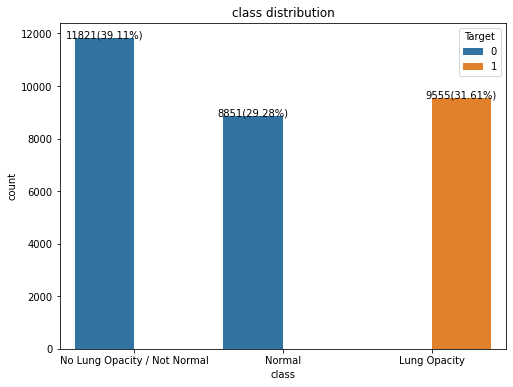

In [ ]:
fig, ax = plt.subplots(1, 1,figsize=(8,6))
sns.countplot(data=train_data,x='class',hue='Target').set_title('class distribution')
total = float(len(train_data['class']))
for p in ax.patches:
    height = p.get_height()
    width = p.get_width()
    x = p.get_x()+p.get_width()/2
    y = height
    value ='{:1.0f}({:1.2f}%)'.format(y,100*height/total)
    #value ='{:1.0f}'.format(y)
    ax.text(x,y,value,ha='center')

**Key Observations**
 - Normal and No lung Opacity are more in samples compared to Lung Opacity
 - Normal & No lung Opacity are labeled as 0 i.e No Pneumonia patients
 - Lung Opacity records are labeled as 1 i.e. Pneumonia patients
 - Pneumonia patient samples are 9555 (~31.61%)
 - Non Pneumonia patient samples but not normal Lung condition samples are 11821 (~39.11%)
 - Normal patient samples are 8851 (~29.28%)


# Writing the train data into pickle file

In [ ]:
train_data_pickle = open('./train_data_pickle', 'wb')

In [ ]:
pickle.dump(train_data, train_data_pickle) 

In [ ]:
train_data_pickle.close()

# Loading the pickle file so as to use the data object from the pickle file

In [ ]:
train_data_pickle = open('./train_data_pickle', 'rb')      

In [ ]:
train_data = pickle.load(train_data_pickle) 

In [ ]:
train_data.head(5)

,patientId,class,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,No Lung Opacity / Not Normal,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,No Lung Opacity / Not Normal,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,No Lung Opacity / Not Normal,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,Normal,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity,264.0,152.0,213.0,379.0,1


In [ ]:
print('Total no of unique patient records:{}'.format(len(train_data.patientId.unique())))

Total no of unique patient records:26684


In [ ]:
print('Impacted by Pneumonia:{}; Non impacted by Pneumonia:{}'.format(len(train_data[train_data['Target']==1].patientId.unique()),len(train_data[train_data['Target']==0].patientId.unique())))

Impacted by Pneumonia:6012; Non impacted by Pneumonia:20672


# Let's do batching of training images

Psuedo Code for batching
 - Split the data from train_data based on target values 0 & 1
 - Check the count of samples for target value 1
 - Split them in to multiple dataframes (of target value 1)
 - Similarly split the data of target value 0 into multiple data frames
 - Concat 0 & 1 with the rationale that we get 10 batches of approx. 3000 samples per each

In [ ]:
train_data_0 = train_data[train_data['Target']==0].copy()
train_data_1 = train_data[train_data['Target']==1].copy()
train_data_0 = train_data_0.reset_index(drop=True)
train_data_1 = train_data_1.reset_index(drop=True)

In [ ]:
batch_names =['X1','X2','X3','X4','X5','X6','X7','X8','X9','X10']
x_1=0
y_1=1000 # There are 9555 Pneumonia infected samples so approx 1000 per batch for 10 batches overall
x_0=0
y_0=2068 # There are 20672 samples as records with no pneumonia infection, so approx 2068 per batch for 10 batches overall
for x in batch_names:
    exec('{} = (train_data_1.iloc[{}:{}]).append(train_data_0.iloc[{}:{}]).reset_index(drop=True)'.format(x,x_1,y_1,x_0,y_0))
    x_1=y_1
    y_1=y_1+1000
    x_0=y_0
    y_0=y_0+2068

# Pickling all 10 data objects - labels and classes

In [ ]:
batch_names =['X1','X2','X3','X4','X5','X6','X7','X8','X9','X10']
for x in batch_names:
  exec('{}_pickle = open("{}", "{}")'.format(x,'./'+x+'_data_pickle','wb'))
  exec('pickle.dump({}, {})'.format(x,x+'_pickle'))
  exec('{}.close()'.format(x+'_pickle'))

# Load the pickled data into objects

In [8]:
batch_names =['X1','X2','X3','X4','X5','X6','X7','X8','X9','X10']
for x in batch_names:
  exec('{}_pickle = open("{}", "{}")'.format(x,'./'+x+'_data_pickle','rb'))
  exec('{}=pickle.load({})'.format(x,x+'_pickle'))

Code Used for creating image batches according to the above created batches
```
# This is formatted as code
import shutil
def batch_files(x,img_path,dest_path):
    data_dict = list(x.T.to_dict().values())
    for i,row in enumerate(data_dict):
        source_file_name= row['patientId']+'.dcm'
        shutil.copy(os.path.join('./',img_path+'/', source_file_name), os.path.join('./',dest_path))

batch_names =['X1','X2','X3','X4','X5','X6','X7','X8','X9','X10']
for x in batch_names:
    img_path='stage_2_train_images'
    exec('batch_files({},"stage_2_train_images","{}")'.format(x,x))
```

Now, we have 10 batches of DICOM image files and the corresponding label & class merged data sets

# Custom Functions Used across the notebook

## Image Size Check Function

In [ ]:
def check_img_size(x):
  for i in range(len(x)):
    ds=dcmread(x[i])
    if(ds.pixel_array.shape!=(1024,1024)):
        print(ds.PatientID)

## Function to display **PneumoniaRegion**

In [ ]:
def show_pneumoniaRegion(x,img_path):
    
    data_dict = list(x.T.to_dict().values())
    fig, ax = plt.subplots(3,2, figsize=(14,18))
    
    for i, row in enumerate(data_dict):
        img = row['patientId']+'.dcm' # derived the corresponding file name for the patient going in the loop
        path = os.path.join('./',img_path+'/',img)
        img_data = dcmread(path) #reading the patient dicom image
        # Start reading a few useful attributes from the image
        modality = img_data.Modality
        sex      = img_data.PatientSex
        age      = img_data.PatientAge
        viewPos  = img_data.ViewPosition
        bodyPart = img_data.BodyPartExamined  
        # End reading a few useful attributes from the image
        
        ax[i//2,i%2].imshow(img_data.pixel_array, cmap = plt.cm.bone)
        ax[i//2,i%2].axis('off')
        ax[i//2,i%2].set_title('ID: {} \n Age: {} Sex: {} Examined:{} Target:{} \n class:{}'.format(row['patientId'],age,sex,bodyPart
                                                                                          ,row['Target'],row['class']))
        # overlay the bounding box
        records = x[x['patientId']==row['patientId']]
        bounding_box = list(records.T.to_dict().values())
        for j, record in enumerate(bounding_box):
            rectangle = patches.Rectangle(xy=(record['x'], record['y']),
                        width=record['width'],height=record['height'], 
                        color="yellow",fc='none',ec='r', lw=4)
            #offsetbox = AuxTransformBox(ax[i//2,i%2].transData)
            #offsetbox.add_artist(rectangle)
            #xy, w, h = (record['x'], record['y']), record['width'], record['height']
            #ab = AnnotationBbox(offsetbox, (xy[0],xy[1]),
                    #boxcoords="data",fontsize=14,
                    #bboxprops=dict(facecolor = "none", edgecolor='r', 
                     #         lw = 14))
            #ax[i//2,i%2].add_artist(ab)
            ax[i//2,i%2].add_patch(rectangle)
    plt.show()



## Function to display normal images

In [ ]:
def show_image(x,img_path):
    data_dict = list(x.T.to_dict().values())
    fig, ax = plt.subplots(3,2, figsize=(14,18))
    
    for i, row in enumerate(data_dict):
        img = row['patientId']+'.dcm' # derived the corresponding file name for the patient going in the loop
        path = os.path.join('./',img_path+'/',img)
        img_data = dcmread(path) #reading the patient dicom image
        # Start reading a few useful attributes from the image
        modality = img_data.Modality
        sex      = img_data.PatientSex
        age      = img_data.PatientAge
        viewPos  = img_data.ViewPosition
        bodyPart = img_data.BodyPartExamined  
        # End reading a few useful attributes from the image
        
        ax[i//2,i%2].imshow(img_data.pixel_array, cmap = plt.cm.bone)
        ax[i//2,i%2].axis('off')
        ax[i//2,i%2].set_title('ID: {} \n Age: {} Sex: {} Examined:{} Target:{} \n class:{}'.format(row['patientId'],age,sex,bodyPart
                                                                                          ,row['Target'],row['class']))
    plt.show()

## Function to extract batch image data

In [ ]:
def extract_batch_DICOM_image_Data(batch_files,img_size):
  data = pd.DataFrame(columns=['patientId','Img_data','Age', 'Sex', 'Modality','Examined','ViewPosition'])
  for i,row in enumerate(batch_files):
    img_data = dcmread('./'+row)
    image = cv.resize(np.array(img_data.pixel_array), (img_size,img_size))
    data.loc[i,'patientId'] = img_data.PatientID
    data.loc[i,'Img_data'] = image
    data.loc[i,'Age']      = img_data.PatientAge
    data.loc[i,'Sex'] = img_data.PatientSex
    data.loc[i,'Modality'] = img_data.Modality
    data.loc[i,'Examined'] = img_data.BodyPartExamined  
    data.loc[i,'ViewPosition']  = img_data.ViewPosition
  return data

## Function to check batch outliers

In [ ]:
def calOutliers(x):
    q1, q3 = np.percentile(x.sort_values(),[25,75])
    iqr = q3 - q1
    lbv = q1 - (1.5 * iqr)
    ubv = q3 + (1.5 * iqr)
    y=x
    outliers1 = y[y < lbv]
    outliers2 = y[y > ubv]
    return (outliers1.count()+outliers2.count())

## Check - Age range a factor in Pneumonia impacts?

In [ ]:
def Check_Age_Factor(X):
  p_age_lt_30 = len(X.query('Age >0 & Age < 30 & Target ==1').patientId.unique())
  p_age_bt_30_60= len(X.query('Age >29 & Age <= 60 & Target ==1').patientId.unique())
  p_age_gt_60 = len(X.query('Age >60 & Target ==1').patientId.unique())
  np_age_lt_30 = len(X.query('Age >0 & Age < 30 & Target ==0').patientId.unique())
  np_age_bt_30_60= len(X.query('Age >29 & Age <= 60 & Target ==0').patientId.unique())
  np_age_gt_60 = len(X.query('Age >60 & Target ==0').patientId.unique())
  per_age_lt_30 = (p_age_lt_30/(p_age_lt_30+np_age_lt_30))*100
  per_age_bt_30_60= (p_age_bt_30_60/(p_age_bt_30_60+np_age_bt_30_60))*100
  per_age_gt_60 = (p_age_gt_60/(p_age_gt_60+np_age_gt_60))*100
  print(pd.DataFrame({'Age 0 -29':[p_age_lt_30], 
              'Age 30 -60':[p_age_bt_30_60], 
              'Age above 60':[p_age_gt_60]}, index=['Pneumonia']).append(pd.DataFrame({'Age 0 -29':[np_age_lt_30], 
              'Age 30 -60':[np_age_bt_30_60], 
              'Age above 60':[np_age_gt_60]}, index=['Non Pneumonia'])).append(pd.DataFrame({'Age 0 -29':[per_age_lt_30], 
              'Age 30 -60':[per_age_bt_30_60], 
              'Age above 60':[per_age_gt_60]}, index=['Impact Ratio'])))

## Hypothesis Check - Male more prone for Pneumonia?

In [ ]:
def Check_Gender_Factor(m_X,f_X):
  z_stat, p_val = proportions_ztest([len(m_X[m_X.Target==1].patientId.unique()),len(f_X[f_X.Target==1].patientId.unique())],[len(m_X.patientId.unique()), len(f_X.patientId.unique())])
  print('z_stat={}, p_val={}'.format(float(z_stat),float(p_val)))
  if (float(p_val)<0.05):
    print("Male and Female proportions are significantly varying with Pneumonia")
  else:
    print("Male and Female proportions are equal with Pneumonia")
  m_count = len(m_X.patientId.unique())
  f_count = len(f_X.patientId.unique())
  m_imp = len(m_X.query('Target==1').patientId.unique())
  f_imp = len(f_X.query('Target==1').patientId.unique())
  nm_imp = len(m_X.query('Target==0').patientId.unique())
  nf_imp = len(f_X.query('Target==0').patientId.unique())
  m_per = (m_imp/m_count)*100
  f_per = (f_imp/f_count)*100
  print(pd.DataFrame({'Male':[m_imp],'Female':[f_imp]},index=['Pneumonia']).append(pd.DataFrame({'Male':[nm_imp],'Female':[nf_imp]},index=['Non Pneumonia']))
  .append(pd.DataFrame({'Male':[m_per],'Female':[f_per]},index=['Ratio']))
       )

## Hypothesis Check - View positions have significant variations for Pneumonia detection?

In [ ]:
def Check_Viewpositions_Factor(ap_X,pa_X):
  z_stat, p_val = proportions_ztest([len(ap_X[ap_X.Target==1].patientId.unique()),len(pa_X[pa_X.Target==1].patientId.unique())],[len(ap_X.patientId.unique()), len(pa_X.patientId.unique())])
  print('z_stat={}, p_val={}'.format(float(z_stat),float(p_val)))
  if (float(p_val)<0.05):
    print("AP and PA view positions proportions are significantly varying with Pneumonia")
  else:
    print("AP and PA view positions proportions are equal with Pneumonia")
  ap_count = len(ap_X.patientId.unique())
  pa_count = len(pa_X.patientId.unique())
  ap_imp = len(ap_X.query('Target==1').patientId.unique())
  pa_imp = len(pa_X.query('Target==1').patientId.unique())
  nap_imp = len(ap_X.query('Target==0').patientId.unique())
  npa_imp = len(pa_X.query('Target==0').patientId.unique())
  ap_per = (ap_imp/ap_count)*100
  pa_per = (pa_imp/pa_count)*100
  print(pd.DataFrame({'AP':[ap_imp],'PA':[pa_imp]},index=['Pneumonia']).append(pd.DataFrame({'AP':[nap_imp],'PA':[npa_imp]},index=['Non Pneumonia']))
  .append(pd.DataFrame({'AP':[ap_per],'PA':[pa_per]},index=['Ratio']))
       )

# Reading all the train and test DICOM images and EDA for all batches

## Reading Test Images

In [ ]:
test_images = list(get_files("./stage_2_test_images"))

### Pickling test image files

In [ ]:
test_images_pickle = open('./test_images_pickle','wb')

In [ ]:
pickle.dump(test_images,test_images_pickle)

In [ ]:
test_images_pickle.close()

### Loading test images pickle

In [ ]:
test_images_pickle = open('./test_images_pickle','rb')

In [ ]:
test_images_set = pickle.load(test_images_pickle)

In [ ]:
print('Total no of unique patient records:{}'.format(len(np.unique(test_images_set))))

Total no of unique patient records:3000


### Test displaying a sample image

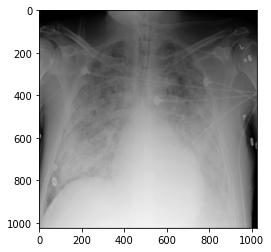

In [ ]:
ds=dcmread(test_images_set[0])
plt.imshow(ds.pixel_array,cmap='gray')
plt.show()

In [ ]:
ds.pixel_array.shape

(1024, 1024)

## Test Data set Image Size Check

In [ ]:
check_img_size(test_images_set)

## Test Data - Extract image and other metadata

In [ ]:
X_test_set=extract_batch_DICOM_image_Data(test_images_set,224)

In [ ]:
X_test_set.head()

,patientId,Img_data,Age,Sex,Modality,Examined,ViewPosition
0,252386b6-2a6c-4e45-98a7-9af73a1f9b13,"[[79, 6, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1...",57,M,CR,CHEST,AP
1,252437ed-a4e2-4743-995c-65a4bb133996,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",31,M,CR,CHEST,PA
2,264d4100-0a4a-460d-81fd-e781bbf6ca86,"[[0, 0, 0, 1, 138, 44, 10, 8, 8, 8, 9, 10, 11,...",62,M,CR,CHEST,AP
3,260a7b23-08ed-451d-bd0a-ecbffc7c3d30,"[[12, 12, 13, 13, 13, 12, 12, 13, 12, 11, 11, ...",72,F,CR,CHEST,AP
4,26902670-d4e8-44e4-b750-5e95cf9dd3d6,"[[4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",43,F,CR,CHEST,PA


In [ ]:
X_test_set.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3000 entries, 0 to 2999
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   patientId     3000 non-null   object
 1   Img_data      3000 non-null   object
 2   Age           3000 non-null   object
 3   Sex           3000 non-null   object
 4   Modality      3000 non-null   object
 5   Examined      3000 non-null   object
 6   ViewPosition  3000 non-null   object
dtypes: object(7)
memory usage: 187.5+ KB


## Change the data type as per our need & label encode for categorical variables

In [ ]:
X_test_set=X_test_set.astype({"Age": int, "Sex": 'category',"ViewPosition":'category',"Modality":'category',"Examined":'category'})

In [ ]:
labelencoder = LabelEncoder()
X_test_set['Sex_Label']= labelencoder.fit_transform(X_test_set['Sex'])
X_test_set['Modality_Label']=labelencoder.fit_transform(X_test_set['Modality'])
X_test_set['Examined_Label']=labelencoder.fit_transform(X_test_set['Examined'])
X_test_set['ViewPosition_Label']=labelencoder.fit_transform(X_test_set['ViewPosition'])

In [ ]:
X_test_set.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3000 entries, 0 to 2999
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   patientId           3000 non-null   object  
 1   Img_data            3000 non-null   object  
 2   Age                 3000 non-null   int64   
 3   Sex                 3000 non-null   category
 4   Modality            3000 non-null   category
 5   Examined            3000 non-null   category
 6   ViewPosition        3000 non-null   category
 7   Sex_Label           3000 non-null   int64   
 8   Modality_Label      3000 non-null   int64   
 9   Examined_Label      3000 non-null   int64   
 10  ViewPosition_Label  3000 non-null   int64   
dtypes: category(4), int64(5), object(2)
memory usage: 199.6+ KB


## Pickling the test data image set

In [ ]:
X_test_set_pickle = open('./X_test_set_pickle','wb')

In [ ]:
pickle.dump(X_test_set,X_test_set_pickle)

In [ ]:
X_test_set_pickle.close()

## Loading the pickle of test data image set

In [9]:
X_test_set_pickle = open('./X_test_set_pickle','rb')

In [10]:
X_test_set = pickle.load(X_test_set_pickle)

## A high level analysis over test data

In [ ]:
X_test_set.head()

,patientId,Img_data,Age,Sex,Modality,Examined,ViewPosition,Sex_Label,Modality_Label,Examined_Label,ViewPosition_Label
0,252386b6-2a6c-4e45-98a7-9af73a1f9b13,"[[79, 6, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1...",57,M,CR,CHEST,AP,1,0,0,0
1,252437ed-a4e2-4743-995c-65a4bb133996,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",31,M,CR,CHEST,PA,1,0,0,1
2,264d4100-0a4a-460d-81fd-e781bbf6ca86,"[[0, 0, 0, 1, 138, 44, 10, 8, 8, 8, 9, 10, 11,...",62,M,CR,CHEST,AP,1,0,0,0
3,260a7b23-08ed-451d-bd0a-ecbffc7c3d30,"[[12, 12, 13, 13, 13, 12, 12, 13, 12, 11, 11, ...",72,F,CR,CHEST,AP,0,0,0,0
4,26902670-d4e8-44e4-b750-5e95cf9dd3d6,"[[4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",43,F,CR,CHEST,PA,0,0,0,1


In [ ]:
print('Total no of unique patient records of test data:{}'.format(len(X_test_set.patientId.unique())))

Total no of unique patient records of test data:3000


In [ ]:
print(pd.DataFrame({'Age 0 -29':[len(X_test_set[(X_test_set['Age'] > 0) & (X_test_set['Age'] < 30)].patientId.unique())], 
              'Age 30 -60':[len(X_test_set[(X_test_set['Age']>29) & (X_test_set['Age']<=60)].patientId.unique())], 
              'Age above 60':[len(X_test_set[X_test_set['Age']>60].patientId.unique())]}, index=['PatientCount']))

              Age 0 -29  Age 30 -60  Age above 60
PatientCount        530        1790           680


In [ ]:
print(pd.DataFrame({
    'Male':[len(X_test_set[X_test_set['Sex_Label']==1].patientId.unique())],
    'Female':[len(X_test_set[X_test_set['Sex_Label']==0].patientId.unique())]
    },index=['Gender Count']))

              Male  Female
Gender Count  1714    1286


In [ ]:
print('Unique view position: {}, Examined: {}, Modality : {}'.format(X_test_set['ViewPosition'].unique(),X_test_set['Examined'].unique(),X_test_set['Modality'].unique()))

Unique view position: ['AP', 'PA']
Categories (2, object): ['AP', 'PA'], Examined: ['CHEST']
Categories (1, object): ['CHEST'], Modality : ['CR']
Categories (1, object): ['CR']


In [ ]:
print('View position AP based patient records: {}'.format(len(X_test_set[X_test_set['ViewPosition']=='AP'].patientId.unique())))

View position AP based patient records: 1382


In [ ]:
calOutliers(X_test_set['Age'])

1

In [ ]:
X_test_set.describe()

,Age,Sex_Label,Modality_Label,Examined_Label,ViewPosition_Label
count,3000.000000,3000.000000,3000.0,3000.0,3000.000000
mean,47.051667,0.571333,0.0,0.0,0.539333
std,18.157154,0.494968,0.0,0.0,0.498534
min,1.000000,0.000000,0.0,0.0,0.000000
25%,34.000000,0.000000,0.0,0.0,0.000000
50%,49.000000,1.000000,0.0,0.0,1.000000
75%,59.000000,1.000000,0.0,0.0,1.000000
max,412.000000,1.000000,0.0,0.0,1.000000


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


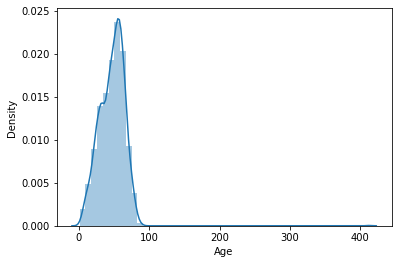

In [ ]:
sns.distplot(X_test_set['Age'])

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


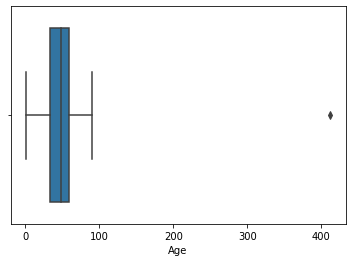

In [ ]:
sns.boxplot(X_test_set['Age'])

**Key Observations**
 - All images in test data are of same size 1024
 - Total unique patient records of test data: 3000
 - Patient Age group: 
    - [0-29]: 530
    - [30-60]: 1790
    - [Above 60]: 680
 - Patient Gender Split
    - Male patients: 1714
    - Female patients: 1286
 - Examined: Chest, Modality: CR and View Positions: AP & PA
 - AP based records 1382
 - There is an outlier in Age, except that one outlier, Age data looks normally distributed

## X1 - Batch ANALYSIS

In [ ]:
train_images_X1_files = list(get_files("./X1"))

### Pickling batch image files

In [ ]:
train_images_X1_pickle = open('./train_images_X1_pickle','wb')

In [ ]:
pickle.dump(train_images_X1_files,train_images_X1_pickle)

In [ ]:
train_images_X1_pickle.close()

### Loading batch image pickles

In [ ]:
train_images_X1_pickle = open('./train_images_X1_pickle','rb')

In [ ]:
train_images_X1 = pickle.load(train_images_X1_pickle) 

### Check the batch image size

In [ ]:
ds = dcmread(train_images_X1[0])

In [ ]:
ds.pixel_array.shape

(1024, 1024)

### Check if all images are of same size

In [ ]:
check_img_size(train_images_X1)

**Key Observations**
 - All images are of same size 1024

### Let's analyze DICOM image data and its attributes

In [ ]:
ds = dcmread(train_images_X1[0])

In [ ]:
ds

(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0016) SOP Class UID                       UI: Secondary Capture Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.2.276.0.7230010.3.1.4.8323329.19066.1517874415.90206
(0008, 0020) Study Date                          DA: '19010101'
(0008, 0030) Study Time                          TM: '000000.00'
(0008, 0050) Accession Number                    SH: ''
(0008, 0060) Modality                            CS: 'CR'
(0008, 0064) Conversion Type                     CS: 'WSD'
(0008, 0090) Referring Physician's Name          PN: ''
(0008, 103e) Series Description                  LO: 'view: AP'
(0010, 0010) Patient's Name                      PN: '325d5974-1e30-4d27-8802-ac3cf1b02e81'
(0010, 0020) Patient ID                          LO: '325d5974-1e30-4d27-8802-ac3cf1b02e81'
(0010, 0030) Patient's Birth Date                DA: ''
(0010, 0040) Patient's Sex                       CS: 'F'
(0010, 1010) Patient's

**Key Observations**
 - May be useful information from the DICOM metadata such as PatientID - Key to combine class & labels with the image Patient's Sex, Age,view position, modality, body part examined & Pixel Data

### Check a few samples with display of images

In [ ]:
#train_sample = train_data.iloc[0:1500]

sample = X1[X1['Target']==1].sample(6)

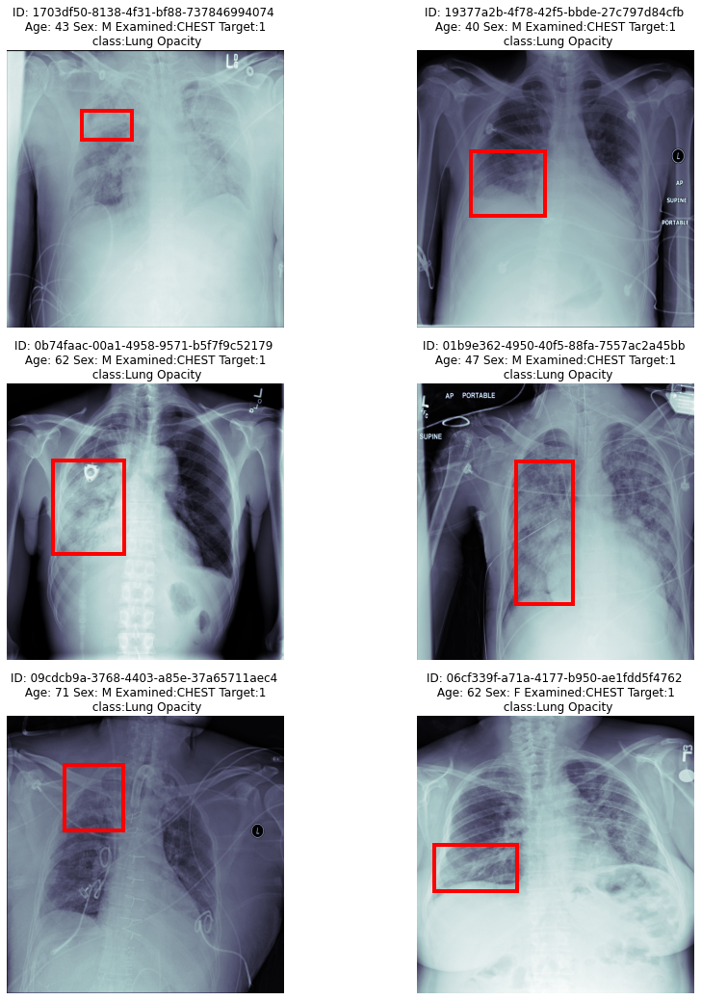

In [ ]:
show_pneumoniaRegion(sample,'X1')

In [ ]:
sample_1= X1[X1['Target']==0].sample(6)

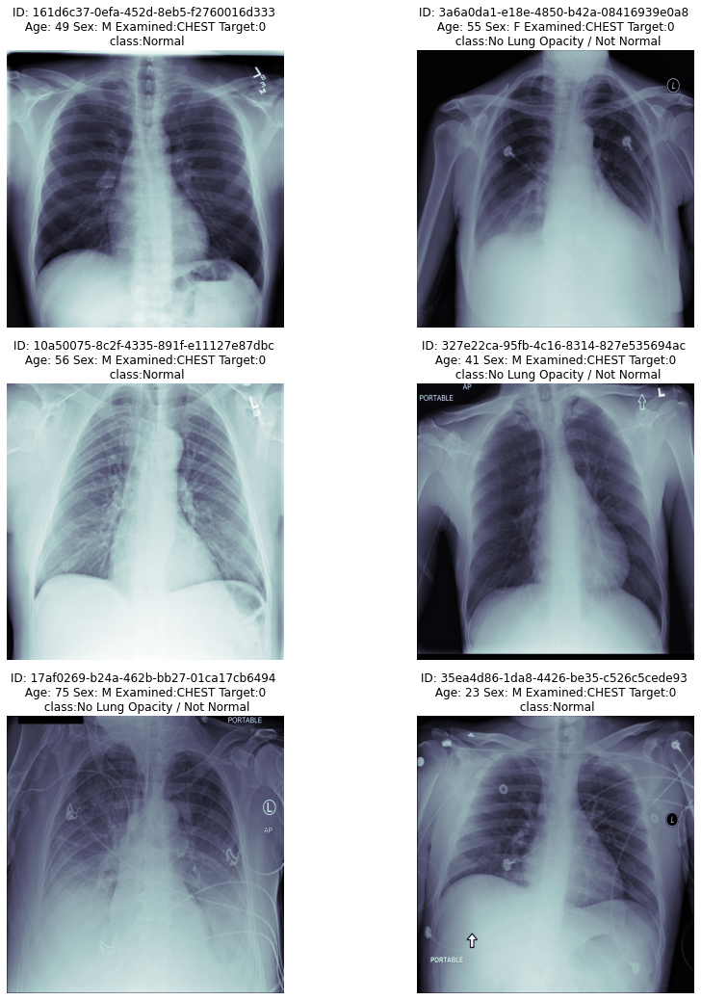

In [ ]:
show_image(sample_1,'X1')

Patient Image with Pneumonia and normal are learned well and displayed respectively

In [ ]:
X1_DICOM_metadata = extract_batch_DICOM_image_Data(train_images_X1,224)

### Combine Image Array data and labels

In [ ]:
X_X1 = pd.merge(X1,X1_DICOM_metadata,how='inner', on='patientId')

In [ ]:
X_X1

,patientId,class,x,y,width,height,Target,Img_data,Age,Sex,Modality,Examined,ViewPosition
0,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity,264.0,152.0,213.0,379.0,1,"[[2, 3, 3, 3, 3, 2, 2, 2, 2, 2, 3, 4, 5, 5, 6,...",32,F,CR,CHEST,AP
1,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity,562.0,152.0,256.0,453.0,1,"[[2, 3, 3, 3, 3, 2, 2, 2, 2, 2, 3, 4, 5, 5, 6,...",32,F,CR,CHEST,AP
2,00704310-78a8-4b38-8475-49f4573b2dbb,Lung Opacity,323.0,577.0,160.0,104.0,1,"[[41, 11, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, ...",75,M,CR,CHEST,PA
3,00704310-78a8-4b38-8475-49f4573b2dbb,Lung Opacity,695.0,575.0,162.0,137.0,1,"[[41, 11, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, ...",75,M,CR,CHEST,PA
4,00aecb01-a116-45a2-956c-08d2fa55433f,Lung Opacity,288.0,322.0,94.0,135.0,1,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",6,F,CR,CHEST,AP
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3063,3be0c383-ad5b-422e-a003-5676bc9d66df,Normal,NaN,NaN,NaN,NaN,0,"[[209, 151, 89, 47, 24, 11, 4, 2, 1, 3, 4, 5, ...",64,F,CR,CHEST,PA
3064,3be323bf-d180-4128-a918-9010d792435b,Normal,NaN,NaN,NaN,NaN,0,"[[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,...",46,M,CR,CHEST,PA
3065,3be3e148-e972-460b-afc5-95c976fd1e06,No Lung Opacity / Not Normal,NaN,NaN,NaN,NaN,0,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",11,F,CR,CHEST,PA
3066,3be5c139-0aa5-4c72-b930-eb513765218e,Normal,NaN,NaN,NaN,NaN,0,"[[240, 235, 236, 231, 234, 229, 228, 225, 226,...",5,F,CR,CHEST,PA


#### Pickling the combined version of batch

In [ ]:
train_X1_comb_pickle = open('./train_X1_comb_pickle','wb')

In [ ]:
pickle.dump(X_X1,train_X1_comb_pickle)

In [ ]:
train_X1_comb_pickle.close()

### Loading the combined version of batch

In [ ]:
train_X1_comb_pickle = open('./train_X1_comb_pickle','rb')

In [ ]:
X_X1 = pickle.load(train_X1_comb_pickle)

### Let's understand the dicom metadata such as Age, Sex, Modality, viewPosition, body part examined

In [ ]:
X_X1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3068 entries, 0 to 3067
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   patientId     3068 non-null   object 
 1   class         3068 non-null   object 
 2   x             1000 non-null   float64
 3   y             1000 non-null   float64
 4   width         1000 non-null   float64
 5   height        1000 non-null   float64
 6   Target        3068 non-null   int64  
 7   Img_data      3068 non-null   object 
 8   Age           3068 non-null   object 
 9   Sex           3068 non-null   object 
 10  Modality      3068 non-null   object 
 11  Examined      3068 non-null   object 
 12  ViewPosition  3068 non-null   object 
dtypes: float64(4), int64(1), object(8)
memory usage: 335.6+ KB


**Key Observations**
 - DICOM metadata contains all as object types
 - Target variable is of int64
 - Bounding box values are following float64 type

In [ ]:
X_X1.isnull().sum()

patientId          0
class              0
x               2068
y               2068
width           2068
height          2068
Target             0
Img_data           0
Age                0
Sex                0
Modality           0
Examined           0
ViewPosition       0
dtype: int64

**Key Observations** 
 - Except x,y,height & width, rest are not null. It is understandable from our earlier data assessment that bounding boxes won't be available for non-infected (or target value 0) patients

### Let's change object type to int for number variables

In [ ]:
X_X1=X_X1.astype({"Age": int, "Sex": 'category',"ViewPosition":'category',"Modality":'category',"Examined":'category'})

In [ ]:
X_X1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3068 entries, 0 to 3067
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   patientId     3068 non-null   object  
 1   class         3068 non-null   object  
 2   x             1000 non-null   float64 
 3   y             1000 non-null   float64 
 4   width         1000 non-null   float64 
 5   height        1000 non-null   float64 
 6   Target        3068 non-null   int64   
 7   Img_data      3068 non-null   object  
 8   Age           3068 non-null   int64   
 9   Sex           3068 non-null   category
 10  Modality      3068 non-null   category
 11  Examined      3068 non-null   category
 12  ViewPosition  3068 non-null   category
dtypes: category(4), float64(4), int64(2), object(3)
memory usage: 252.0+ KB


### Label Encoding for categorical Variables

In [ ]:
labelencoder = LabelEncoder()

In [ ]:
X_X1['Sex_Label']= labelencoder.fit_transform(X_X1['Sex'])
X_X1['Modality_Label']=labelencoder.fit_transform(X_X1['Modality'])
X_X1['Examined_Label']=labelencoder.fit_transform(X_X1['Examined'])
X_X1['ViewPosition_Label']=labelencoder.fit_transform(X_X1['ViewPosition'])

In [ ]:
X_X1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3068 entries, 0 to 3067
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   patientId           3068 non-null   object  
 1   class               3068 non-null   object  
 2   x                   1000 non-null   float64 
 3   y                   1000 non-null   float64 
 4   width               1000 non-null   float64 
 5   height              1000 non-null   float64 
 6   Target              3068 non-null   int64   
 7   Img_data            3068 non-null   object  
 8   Age                 3068 non-null   int64   
 9   Sex                 3068 non-null   category
 10  Modality            3068 non-null   category
 11  Examined            3068 non-null   category
 12  ViewPosition        3068 non-null   category
 13  Sex_Label           3068 non-null   int64   
 14  Modality_Label      3068 non-null   int64   
 15  Examined_Label      3068 non-null   in

In [ ]:
X_X1.head(5)

,patientId,class,x,y,width,height,Target,Img_data,Age,Sex,Modality,Examined,ViewPosition,Sex_Label,Modality_Label,Examined_Label,ViewPosition_Label
0,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity,264.0,152.0,213.0,379.0,1,"[[2, 3, 3, 3, 3, 2, 2, 2, 2, 2, 3, 4, 5, 5, 6,...",32,F,CR,CHEST,AP,0,0,0,0
1,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity,562.0,152.0,256.0,453.0,1,"[[2, 3, 3, 3, 3, 2, 2, 2, 2, 2, 3, 4, 5, 5, 6,...",32,F,CR,CHEST,AP,0,0,0,0
2,00704310-78a8-4b38-8475-49f4573b2dbb,Lung Opacity,323.0,577.0,160.0,104.0,1,"[[41, 11, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, ...",75,M,CR,CHEST,PA,1,0,0,1
3,00704310-78a8-4b38-8475-49f4573b2dbb,Lung Opacity,695.0,575.0,162.0,137.0,1,"[[41, 11, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, ...",75,M,CR,CHEST,PA,1,0,0,1
4,00aecb01-a116-45a2-956c-08d2fa55433f,Lung Opacity,288.0,322.0,94.0,135.0,1,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",6,F,CR,CHEST,AP,0,0,0,0


### Pickling with label encoding for categorical variables

In [ ]:
train_X_X1_comb_pickle = open('./train_X_X1_comb_pickle','wb')

In [ ]:
pickle.dump(X_X1,train_X_X1_comb_pickle)

In [ ]:
train_X_X1_comb_pickle.close()

### Loading the pickle with label encoding for categorical variables

In [ ]:
train_X_X1_comb_pickle = open('./train_X_X1_comb_pickle','rb')

In [ ]:
X_X1=pickle.load(train_X_X1_comb_pickle)

### Multi-variate Analysis

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

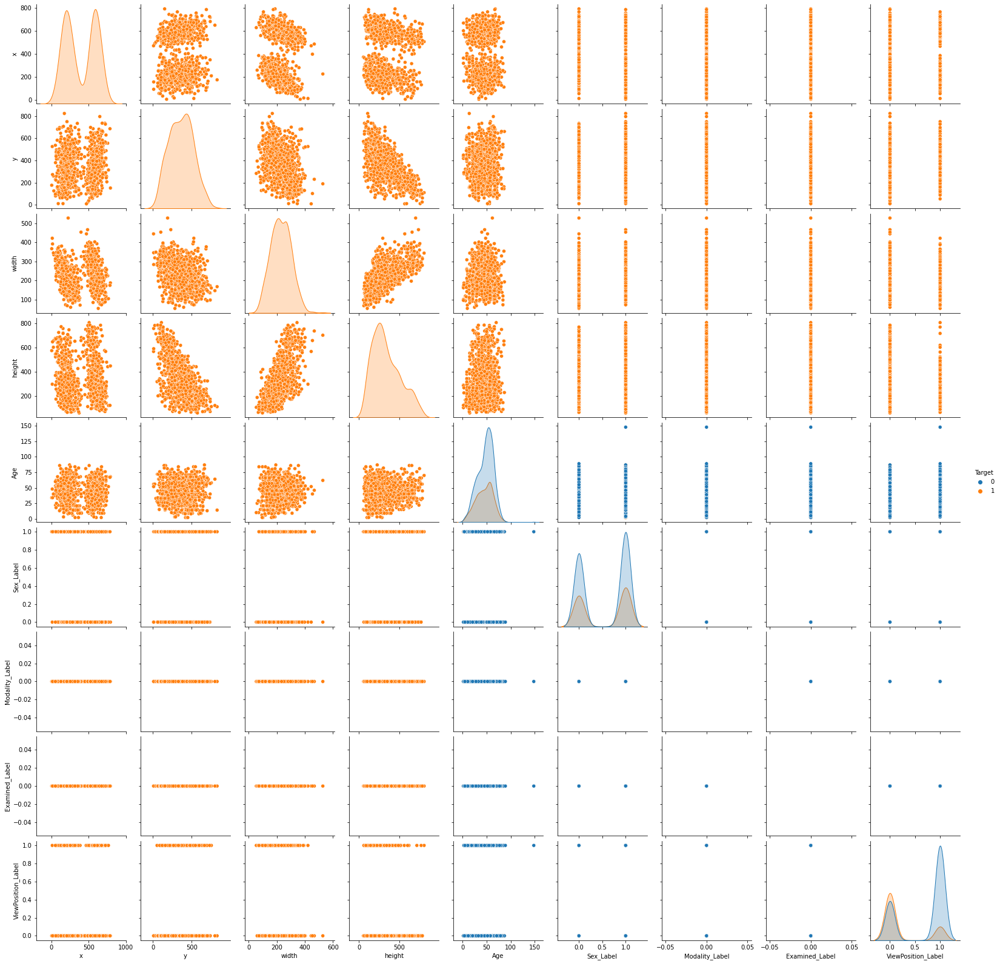

In [ ]:
sns.pairplot(X_X1, hue='Target',diag_kind='kde')

**Key Observations** 
- Age looks to be having Pneumonia infected patients of all age groups
- Sex both male and female are not so predictable but combining age and sex may give some interesting points
- View Position AP provides more Pneumonia reports than PA

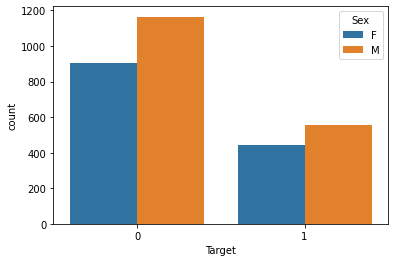

In [ ]:
sns.countplot(data=X_X1,x='Target',hue='Sex')

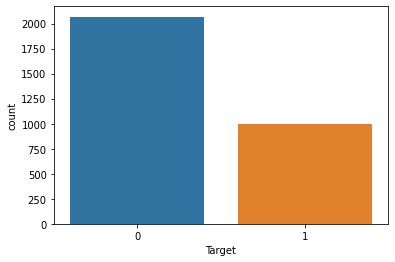

In [ ]:
sns.countplot(data=X_X1,x='Target')

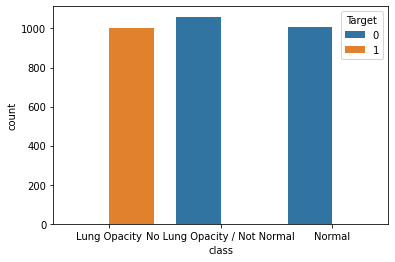

In [ ]:
sns.countplot(data=X_X1,x='class',hue='Target')

In [ ]:
X_X1['Modality'].unique() 

['CR']
Categories (1, object): ['CR']

In [ ]:
X_X1['Examined'].unique()

['CHEST']
Categories (1, object): ['CHEST']

In [ ]:
X_X1['ViewPosition'].unique()

['AP', 'PA']
Categories (2, object): ['AP', 'PA']

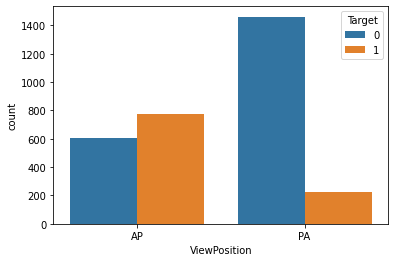

In [ ]:
sns.countplot(data=X_X1,x='ViewPosition',hue='Target')

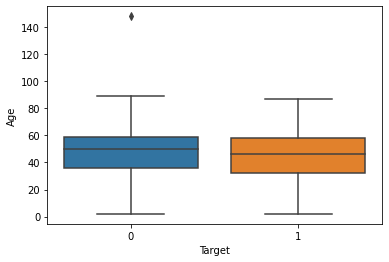

In [ ]:
sns.boxplot(x=X_X1['Target'],y=X_X1['Age'])

In [ ]:
Age_outlier=calOutliers(X_X1['Age'])
print(Age_outlier)

1


**Key Observations** 
- All age groups are impacted 
- Age has an outlier which can be safely ignored
- Males are more impacted than Female but not in big margin
- Impacted patients are about 1000 in numbers out of 3068 samples
- All records are with CR(Computed Radiography) modality so we can ignore this
- All records are with Chest examined so we can ignore this
- There are two view position categories such as AP and PA

### Hypothesis Checks
 - Age of certain range only has Pneumonia probabilities
    - O to 29
    - 30 to 60
    - Above 60
 - Men look more vulnerable for Pneumonia infection and severity
 - View position AP or PA significant for Pneumonia detection

#### Let's understand the Pneumonia impacts of age groups

In [ ]:
Check_Age_Factor(X_X1)

                Age 0 -29   Age 30 -60  Age above 60
Pneumonia      126.000000   384.000000    115.000000
Non Pneumonia  342.000000  1275.000000    451.000000
Impact Ratio    26.923077    23.146474     20.318021


#### Let's understand the difference between the pneumonia impacts over gender proportion

In [ ]:
# Gender
Check_Gender_Factor(X_X1[X_X1['Sex_Label']==1],X_X1[X_X1['Sex_Label']==0])

z_stat=-0.006459044159115696, p_val=0.9948464642215318
Male and Female proportions are equal with Pneumonia
                      Male      Female
Pneumonia       352.000000  273.000000
Non Pneumonia  1165.000000  903.000000
Ratio            23.203691   23.214286


#### Let's check the proportion of view positions (AP, PA)


In [ ]:
Check_Viewpositions_Factor(X_X1[X_X1['ViewPosition_Label']==0],X_X1[X_X1['ViewPosition_Label']==1])

z_stat=19.476624624926238, p_val=1.7333726959928955e-84
AP and PA view positions proportions are significantly varying with Pneumonia
                       AP           PA
Pneumonia      455.000000   170.000000
Non Pneumonia  607.000000  1461.000000
Ratio           42.843691    10.423053


#### **Key Observations**
- All age groups are impacted but patients with age group less than 30 are more impacted in proportions
- Pneumonia Impacted proportion within Age group: [0-29] ~27%, [30-60] ~23%, [Above 60] ~20%
- Male and Female Proportions within gender group of pneumonia impacts are looking very close to each other ~ 23% in each group
- View position AP looks to be more Pneumonia detecting position, suggested by ~43% within the sample taken with AP; whereas for PA it is about 10%

### X1 Data Insights
- All images are of same size 1024
- Impacted patients are about 1000 in numbers out of 3068 samples
- All records are with CR(Computed Radiography) modality
- All records are with Chest examined 
- Bounding boxes won't be available for non-infected (or target value 0) patients
- No duplicates of patients between Pneumonia and Normal records
- All age groups are impacted but patients with age group less than 30 are more impacted in proportions
- Pneumonia Impacted proportion within Age group: [0-29] ~27%, [30-60] ~23%, [Above 60] ~20%
- Male and Female Proportions within gender group of pneumonia impacts are looking very close to each other ~ 23% in each group
- View position AP looks to be more Pneumonia detecting position, suggested by ~43% within the sample taken with AP; whereas for PA it is about 10%

## X2 - Batch ANALYSIS

In [ ]:
train_images_X2_files = list(get_files('./X2'))

### Pickling X2 batch image files

In [ ]:
train_images_X2_pickle = open('./train_images_X2_pickle','wb')
pickle.dump(train_images_X2_files,train_images_X2_pickle)
train_images_X2_pickle.close()

### Loading X2 batch image pickles

In [ ]:
train_images_X2_pickle = open('./train_images_X2_pickle','rb')
train_images_X2 = pickle.load(train_images_X2_pickle)

### Check the X2 batch image size

In [ ]:
check_img_size(train_images_X2)

**Key Observations**
 - All images  are of same size 1024

### Combine Image Array data and labels

In [ ]:
X2_DICOM_metadata = extract_batch_DICOM_image_Data(train_images_X2,224)


In [ ]:
X_X2 = pd.merge(X2,X2_DICOM_metadata,how='inner', on='patientId')

#### Pickling the combined version of batch X2

In [ ]:
train_X2_comb_pickle = open('./train_X2_comb_pickle','wb')
pickle.dump(X_X2,train_X2_comb_pickle)
train_X2_comb_pickle.close()

### Loading the combined version of batch X2

In [ ]:
train_X2_comb_pickle = open('./train_X2_comb_pickle','rb')
X_X2 = pickle.load(train_X2_comb_pickle)

### Let's understand the dicom metadata such as Age, Sex, Modality, viewPosition, body part examined

In [ ]:
X_X2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3068 entries, 0 to 3067
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   patientId     3068 non-null   object 
 1   class         3068 non-null   object 
 2   x             1000 non-null   float64
 3   y             1000 non-null   float64
 4   width         1000 non-null   float64
 5   height        1000 non-null   float64
 6   Target        3068 non-null   int64  
 7   Img_data      3068 non-null   object 
 8   Age           3068 non-null   object 
 9   Sex           3068 non-null   object 
 10  Modality      3068 non-null   object 
 11  Examined      3068 non-null   object 
 12  ViewPosition  3068 non-null   object 
dtypes: float64(4), int64(1), object(8)
memory usage: 335.6+ KB


**Key Observations**
 - DICOM metadata contains all as object types
 - Target variable is of int64
 - Bounding box values are following float64 type

In [ ]:
X_X2.isnull().sum()

patientId          0
class              0
x               2068
y               2068
width           2068
height          2068
Target             0
Img_data           0
Age                0
Sex                0
Modality           0
Examined           0
ViewPosition       0
dtype: int64

**Key Observations** 
 - Except x,y,height & width, rest are not null. It is understandable from our earlier data assessment that bounding boxes won't be available for non-infected (or target value 0) patients

### Let's change object type to int for number variables

In [ ]:
X_X2=X_X2.astype({"Age": int, "Sex": 'category',"ViewPosition":'category',"Modality":'category',"Examined":'category'})

### Label Encoding for categorical Variables

In [ ]:
labelencoder = LabelEncoder()
X_X2['Sex_Label']= labelencoder.fit_transform(X_X2['Sex'])
X_X2['Modality_Label']=labelencoder.fit_transform(X_X2['Modality'])
X_X2['Examined_Label']=labelencoder.fit_transform(X_X2['Examined'])
X_X2['ViewPosition_Label']=labelencoder.fit_transform(X_X2['ViewPosition'])

In [ ]:
X_X2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3068 entries, 0 to 3067
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   patientId           3068 non-null   object  
 1   class               3068 non-null   object  
 2   x                   1000 non-null   float64 
 3   y                   1000 non-null   float64 
 4   width               1000 non-null   float64 
 5   height              1000 non-null   float64 
 6   Target              3068 non-null   int64   
 7   Img_data            3068 non-null   object  
 8   Age                 3068 non-null   int64   
 9   Sex                 3068 non-null   category
 10  Modality            3068 non-null   category
 11  Examined            3068 non-null   category
 12  ViewPosition        3068 non-null   category
 13  Sex_Label           3068 non-null   int64   
 14  Modality_Label      3068 non-null   int64   
 15  Examined_Label      3068 non-null   in

### Pickling X_X2 with label encoding for categorical variables

In [ ]:
train_X_X2_comb_pickle = open('./train_X_X2_comb_pickle','wb')
pickle.dump(X_X2,train_X_X2_comb_pickle)
train_X_X2_comb_pickle.close()

### Loading the pickle of X_X2 with label encoding for categorical variables

In [ ]:
train_X_X2_comb_pickle = open('./train_X_X2_comb_pickle','rb')
X_X2=pickle.load(train_X_X2_comb_pickle)

In [ ]:
X_X2.head(5)

,patientId,class,x,y,width,height,Target,Img_data,Age,Sex,Modality,Examined,ViewPosition,Sex_Label,Modality_Label,Examined_Label,ViewPosition_Label
0,31102758-a5ba-44c9-b480-b744bcfcb861,Lung Opacity,154.0,479.0,146.0,131.0,1,"[[6, 7, 7, 7, 7, 5, 5, 5, 5, 3, 5, 9, 13, 15, ...",66,F,CR,CHEST,AP,0,0,0,0
1,31368401-b882-40ef-a728-8657ea3144b4,Lung Opacity,626.0,611.0,129.0,91.0,1,"[[8, 9, 9, 8, 8, 7, 7, 7, 7, 6, 5, 5, 4, 4, 3,...",71,M,CR,CHEST,AP,1,0,0,0
2,31368401-b882-40ef-a728-8657ea3144b4,Lung Opacity,283.0,488.0,129.0,68.0,1,"[[8, 9, 9, 8, 8, 7, 7, 7, 7, 6, 5, 5, 4, 4, 3,...",71,M,CR,CHEST,AP,1,0,0,0
3,31428408-0d97-4ff5-b387-8d1c95cf5a0d,Lung Opacity,588.0,314.0,159.0,92.0,1,"[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",41,F,CR,CHEST,PA,0,0,0,1
4,31428408-0d97-4ff5-b387-8d1c95cf5a0d,Lung Opacity,540.0,423.0,225.0,171.0,1,"[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",41,F,CR,CHEST,PA,0,0,0,1


### Multi-variate Analysis

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

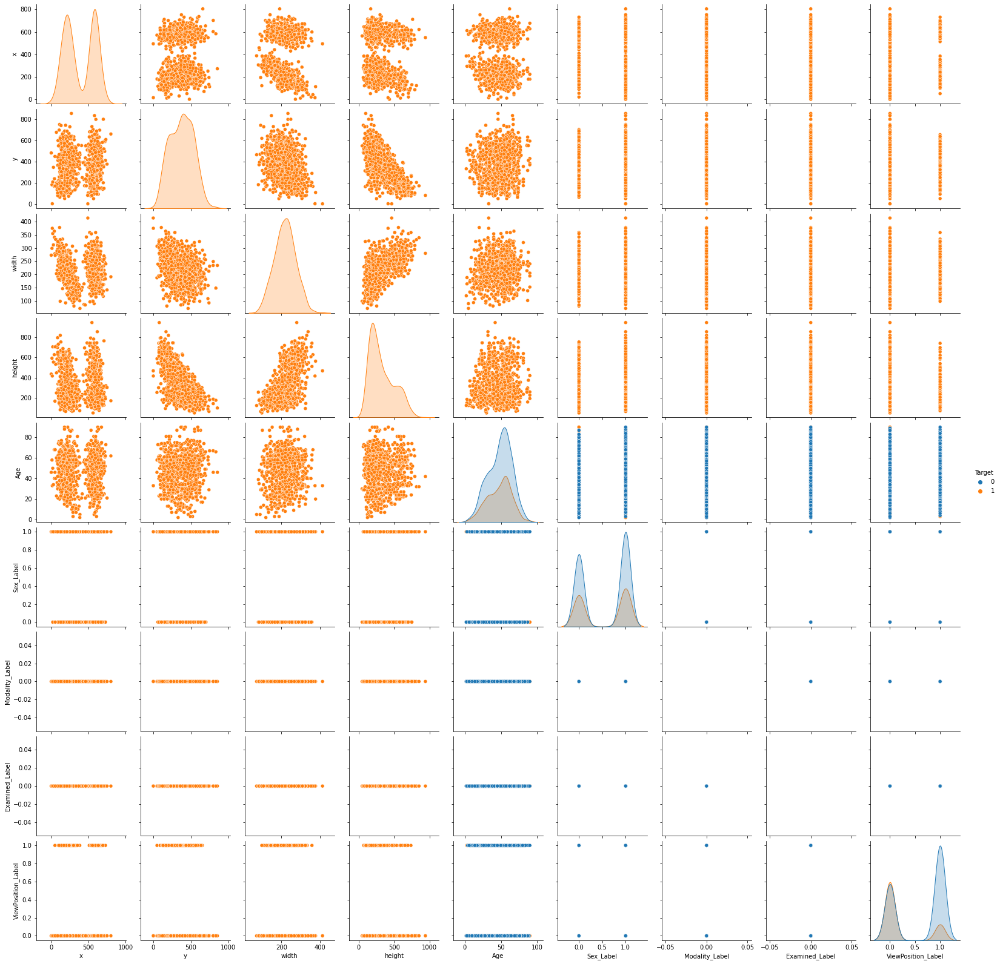

In [ ]:
sns.pairplot(X_X2, hue='Target',diag_kind='kde')

**Key Observations** 
- Age looks to be having Pneumonia infected patients of all age groups
- Sex both male and female are not so predictable but combining age and sex may give some interesting points
- View Position AP provides more Pneumonia reports than PA

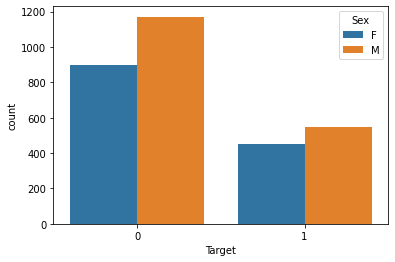

In [ ]:
sns.countplot(data=X_X2,x='Target',hue='Sex')

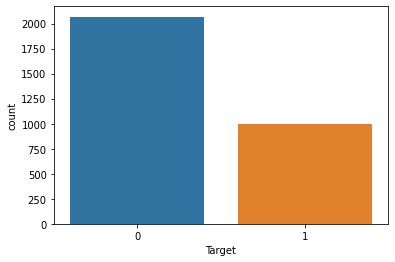

In [ ]:
sns.countplot(data=X_X2,x='Target')

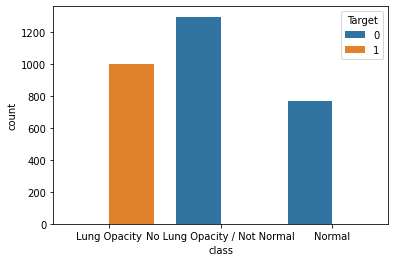

In [ ]:
sns.countplot(data=X_X2,x='class',hue='Target')

In [ ]:
X_X2['Modality'].unique() 

['CR']
Categories (1, object): ['CR']

In [ ]:
X_X2['Examined'].unique()

['CHEST']
Categories (1, object): ['CHEST']

In [ ]:
X_X2['ViewPosition'].unique()

['AP', 'PA']
Categories (2, object): ['AP', 'PA']

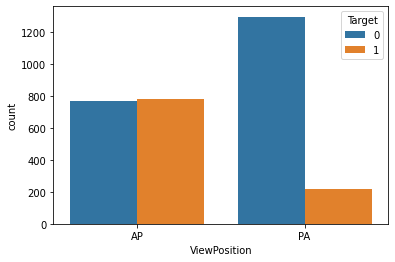

In [ ]:
sns.countplot(data=X_X2,x='ViewPosition',hue='Target')

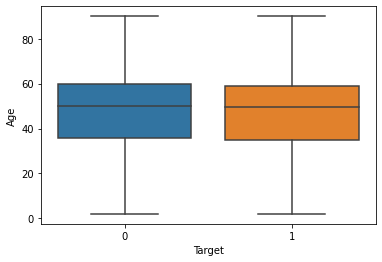

In [ ]:
sns.boxplot(x=X_X2['Target'],y=X_X2['Age'])

In [ ]:
Age_outlier=calOutliers(X_X2['Age'])
print(Age_outlier)

0


**Key Observations** 
- All age groups are impacted 
- Males are more impacted than Female but not in big margin
- Impacted patients are about 1000 in numbers out of 3068 samples
- All records are with CR(Computed Radiography) modality so we can ignore this
- All records are with Chest examined so we can ignore this
- There are two view position categories such as AP and PA

### Hypothesis Checks
 - Age of certain range only has Pneumonia probabilities
    - O to 29
    - 30 to 60
    - Above 60
 - Men look more vulnerable for Pneumonia infection and severity
 - View position AP or PA significant for Pneumonia detection

#### Let's understand the Pneumonia impacts of age groups

In [ ]:
Check_Age_Factor(X_X2)

                Age 0 -29   Age 30 -60  Age above 60
Pneumonia       95.000000   351.000000    130.000000
Non Pneumonia  314.000000  1257.000000    497.000000
Impact Ratio    23.227384    21.828358     20.733652


#### Let's understand the difference between the pneumonia impacts over gender proportion

In [ ]:
Check_Gender_Factor(X_X2[X_X2['Sex_Label']==1],X_X2[X_X2['Sex_Label']==0])

z_stat=-0.38336862957324885, p_val=0.7014464597826081
Male and Female proportions are equal with Pneumonia
                      Male      Female
Pneumonia       321.000000  255.000000
Non Pneumonia  1171.000000  897.000000
Ratio            21.514745   22.135417


#### Let's check the proportion of view positions (AP, PA)

In [ ]:
Check_Viewpositions_Factor(X_X2[X_X2['ViewPosition_Label']==0],X_X2[X_X2['ViewPosition_Label']==1])

z_stat=15.588148920030253, p_val=8.763633142457291e-55
AP and PA view positions proportions are significantly varying with Pneumonia
                       AP          PA
Pneumonia      425.000000   151.00000
Non Pneumonia  770.000000  1298.00000
Ratio           35.564854    10.42098


#### **Key Observations**
- All age groups are impacted but patients with age group less than 30 are more impacted in proportions
- Pneumonia Impacted proportion within Age group: [0-29] ~23%, [30-60] ~22%, [Above 60] ~20%
- Male and Female Proportions within gender group of pneumonia impacts are looking very close to each other ~ 22% in each group
- View position AP looks to be more Pneumonia detecting position, suggested by ~36% within the sample taken with AP; whereas for PA it is about 10%

### X2 Data Insights
- All images  are of same size 1024
- Impacted patients are about 1000 in numbers out of 3068 samples
- All records are with CR(Computed Radiography) modality
- All records are with Chest examined 
- Bounding boxes won't be available for non-infected (or target value 0) patients
- No duplicates of patients between Pneumonia and Normal records
- All age groups are impacted but patients with age group less than 30 are more impacted in proportions
- Pneumonia Impacted proportion within Age group: [0-29] ~23%, [30-60] ~22%, [Above 60] ~20%
- Male and Female Proportions within gender group of pneumonia impacts are looking very close to each other ~ 22% in each group
- View position AP looks to be more Pneumonia detecting position, suggested by ~36% within the sample taken with AP; whereas for PA it is about 10%

## X3 - Batch ANALYSIS

In [ ]:
train_images_X3_files = list(get_files('./X3'))

### Pickling batch image files

In [ ]:
train_images_X3_pickle = open('./train_images_X3_pickle','wb')
pickle.dump(train_images_X3_files,train_images_X3_pickle)
train_images_X3_pickle.close()

### Loading batch image pickles

In [ ]:
train_images_X3_pickle = open('./train_images_X3_pickle','rb')
train_images_X3 = pickle.load(train_images_X3_pickle)

### Check the batch image size

In [ ]:
check_img_size(train_images_X3)

**Key Observations**
 - All images  are of same size 1024

### Combine Image Array data and labels

In [ ]:
X3_DICOM_metadata = extract_batch_DICOM_image_Data(train_images_X3,224)


In [ ]:
X_X3 = pd.merge(X3,X3_DICOM_metadata,how='inner', on='patientId')

#### Pickling the combined version of batch

In [ ]:
train_X3_comb_pickle = open('./train_X3_comb_pickle','wb')
pickle.dump(X_X3,train_X3_comb_pickle)
train_X3_comb_pickle.close()

### Loading the combined version of batch

In [ ]:
train_X3_comb_pickle = open('./train_X3_comb_pickle','rb')
X_X3 = pickle.load(train_X3_comb_pickle)

### Let's understand the dicom metadata such as Age, Sex, Modality, viewPosition, body part examined

In [ ]:
X_X3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3068 entries, 0 to 3067
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   patientId     3068 non-null   object 
 1   class         3068 non-null   object 
 2   x             1000 non-null   float64
 3   y             1000 non-null   float64
 4   width         1000 non-null   float64
 5   height        1000 non-null   float64
 6   Target        3068 non-null   int64  
 7   Img_data      3068 non-null   object 
 8   Age           3068 non-null   object 
 9   Sex           3068 non-null   object 
 10  Modality      3068 non-null   object 
 11  Examined      3068 non-null   object 
 12  ViewPosition  3068 non-null   object 
dtypes: float64(4), int64(1), object(8)
memory usage: 335.6+ KB


**Key Observations**
 - DICOM metadata contains all as object types
 - Target variable is of int64
 - Bounding box values are following float64 type

In [ ]:
X_X3.isnull().sum()

patientId          0
class              0
x               2068
y               2068
width           2068
height          2068
Target             0
Img_data           0
Age                0
Sex                0
Modality           0
Examined           0
ViewPosition       0
dtype: int64

**Key Observations** 
 - Except x,y,height & width, rest are not null. It is understandable from our earlier data assessment that bounding boxes won't be available for non-infected (or target value 0) patients

### Let's change object type to int for number variables

In [ ]:
X_X3=X_X3.astype({"Age": int, "Sex": 'category',"ViewPosition":'category',"Modality":'category',"Examined":'category'})

### Label Encoding for categorical Variables

In [ ]:
labelencoder = LabelEncoder()
X_X3['Sex_Label']= labelencoder.fit_transform(X_X3['Sex'])
X_X3['Modality_Label']=labelencoder.fit_transform(X_X3['Modality'])
X_X3['Examined_Label']=labelencoder.fit_transform(X_X3['Examined'])
X_X3['ViewPosition_Label']=labelencoder.fit_transform(X_X3['ViewPosition'])

In [ ]:
X_X3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3068 entries, 0 to 3067
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   patientId           3068 non-null   object  
 1   class               3068 non-null   object  
 2   x                   1000 non-null   float64 
 3   y                   1000 non-null   float64 
 4   width               1000 non-null   float64 
 5   height              1000 non-null   float64 
 6   Target              3068 non-null   int64   
 7   Img_data            3068 non-null   object  
 8   Age                 3068 non-null   int64   
 9   Sex                 3068 non-null   category
 10  Modality            3068 non-null   category
 11  Examined            3068 non-null   category
 12  ViewPosition        3068 non-null   category
 13  Sex_Label           3068 non-null   int64   
 14  Modality_Label      3068 non-null   int64   
 15  Examined_Label      3068 non-null   in

### Pickling with label encoding for categorical variables

In [ ]:
train_X_X3_comb_pickle = open('./train_X_X3_comb_pickle','wb')
pickle.dump(X_X3,train_X_X3_comb_pickle)
train_X_X3_comb_pickle.close()

### Loading the pickle  with label encoding for categorical variables

In [ ]:
train_X_X3_comb_pickle = open('./train_X_X3_comb_pickle','rb')
X_X3=pickle.load(train_X_X3_comb_pickle)

In [ ]:
X_X3.head(5)

,patientId,class,x,y,width,height,Target,Img_data,Age,Sex,Modality,Examined,ViewPosition,Sex_Label,Modality_Label,Examined_Label,ViewPosition_Label
0,3cf4dbff-f5ff-407e-b902-be8040ed992a,Lung Opacity,94.0,419.0,207.0,289.0,1,"[[19, 20, 15, 14, 15, 16, 16, 21, 17, 15, 13, ...",74,F,CR,CHEST,AP,0,0,0,0
1,3cf4dbff-f5ff-407e-b902-be8040ed992a,Lung Opacity,521.0,284.0,199.0,646.0,1,"[[19, 20, 15, 14, 15, 16, 16, 21, 17, 15, 13, ...",74,F,CR,CHEST,AP,0,0,0,0
2,3cfaf293-a1a0-4130-b994-ad3df8a4008c,Lung Opacity,200.0,460.0,148.0,295.0,1,"[[246, 240, 232, 230, 221, 219, 216, 214, 211,...",70,M,CR,CHEST,PA,1,0,0,1
3,3cfd007a-77cd-4125-900e-e0e014592a35,Lung Opacity,125.0,347.0,277.0,495.0,1,"[[3, 5, 7, 8, 9, 10, 10, 11, 11, 10, 11, 11, 1...",38,M,CR,CHEST,AP,1,0,0,0
4,3cfd007a-77cd-4125-900e-e0e014592a35,Lung Opacity,528.0,321.0,307.0,486.0,1,"[[3, 5, 7, 8, 9, 10, 10, 11, 11, 10, 11, 11, 1...",38,M,CR,CHEST,AP,1,0,0,0


### Multi-variate Analysis

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

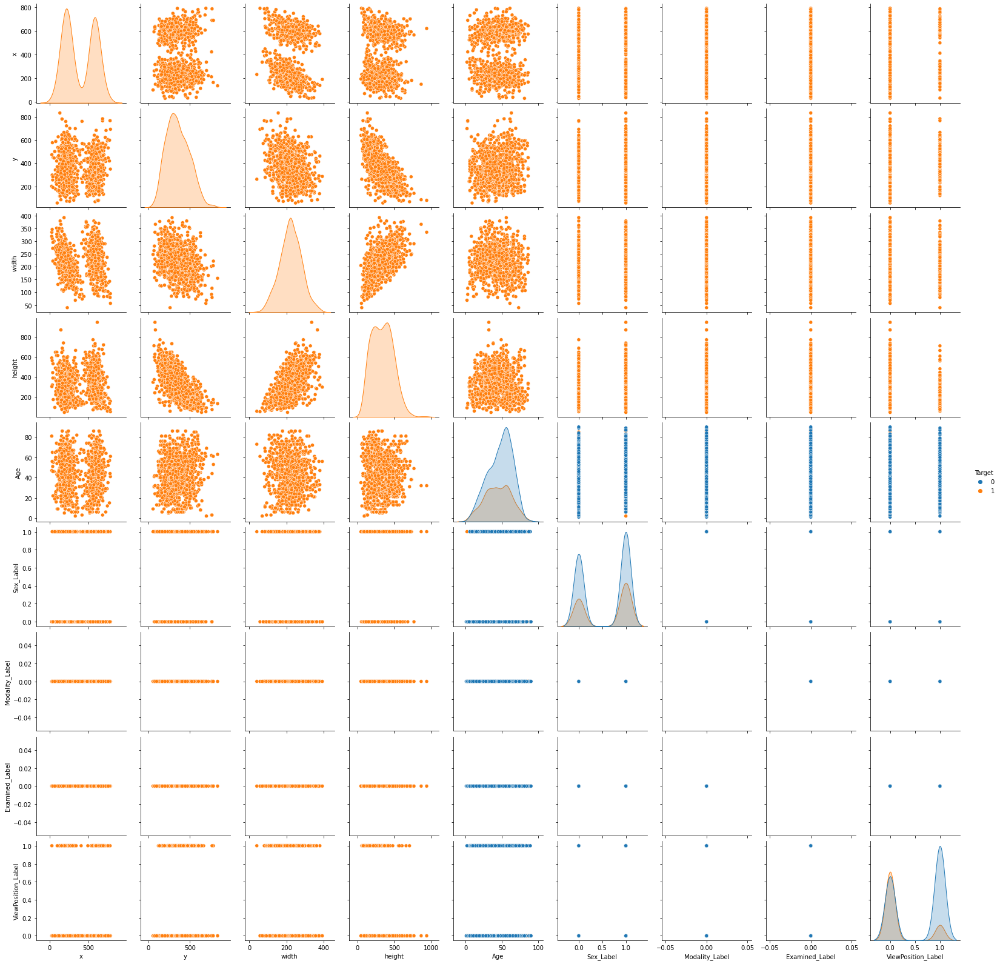

In [ ]:
sns.pairplot(X_X3, hue='Target',diag_kind='kde')

**Key Observations** 
- Age looks to be having Pneumonia infected patients of all age groups
- Sex both male and female are not so predictable but combining age and sex may give some interesting points
- View Position AP provides more Pneumonia reports than PA

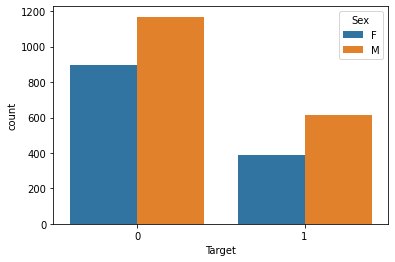

In [ ]:
sns.countplot(data=X_X3,x='Target',hue='Sex')

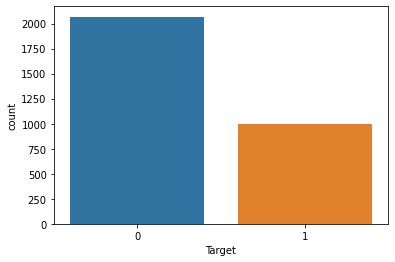

In [ ]:
sns.countplot(data=X_X3,x='Target')

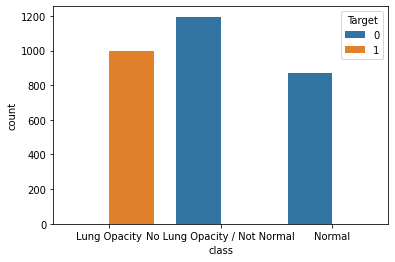

In [ ]:
sns.countplot(data=X_X3,x='class',hue='Target')

In [ ]:
X_X3['Modality'].unique() 

['CR']
Categories (1, object): ['CR']

In [ ]:
X_X3['Examined'].unique()

['CHEST']
Categories (1, object): ['CHEST']

In [ ]:
X_X3['ViewPosition'].unique()

['AP', 'PA']
Categories (2, object): ['AP', 'PA']

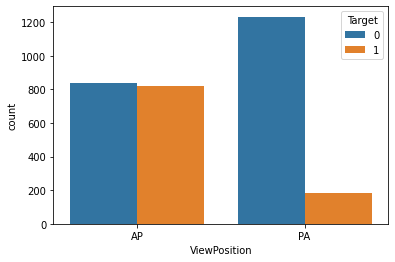

In [ ]:
sns.countplot(data=X_X3,x='ViewPosition',hue='Target')

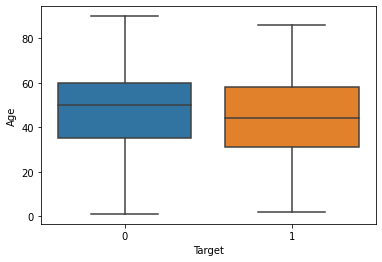

In [ ]:
sns.boxplot(x=X_X3['Target'],y=X_X3['Age'])

In [ ]:
Age_outlier=calOutliers(X_X3['Age'])
print(Age_outlier)

0


**Key Observations** 
- All age groups are impacted 
- Males are more impacted than Female but not in big margin
- Impacted patients are about 1000 in numbers out of 3068 samples
- All records are with CR(Computed Radiography) modality so we can ignore this
- All records are with Chest examined so we can ignore this
- There are two view position categories such as AP and PA

### Hypothesis Checks
 - Age of certain range only has Pneumonia probabilities
    - O to 29
    - 30 to 60
    - Above 60
 - Men look more vulnerable for Pneumonia infection and severity
 - View position AP or PA significant for Pneumonia detection

#### Let's understand the Pneumonia impacts of age groups

In [ ]:
Check_Age_Factor(X_X3)

                Age 0 -29   Age 30 -60  Age above 60
Pneumonia      144.000000   367.000000     127.00000
Non Pneumonia  351.000000  1241.000000     476.00000
Impact Ratio    29.090909    22.823383      21.06136


#### Let's understand the difference between the pneumonia impacts over gender proportion

In [ ]:
Check_Gender_Factor(X_X3[X_X3['Sex_Label']==1],X_X3[X_X3['Sex_Label']==0])

z_stat=2.266542482191924, p_val=0.023418189175474953
Male and Female proportions are significantly varying with Pneumonia
                      Male      Female
Pneumonia       393.000000  245.000000
Non Pneumonia  1169.000000  899.000000
Ratio            25.160051   21.416084


#### Let's check the proportion of view positions (AP, PA)

In [ ]:
Check_Viewpositions_Factor(X_X3[X_X3['ViewPosition_Label']==0],X_X3[X_X3['ViewPosition_Label']==1])

z_stat=16.413179523855366, p_val=1.539288538454993e-60
AP and PA view positions proportions are significantly varying with Pneumonia
                       AP      PA
Pneumonia      495.000000   143.0
Non Pneumonia  836.000000  1232.0
Ratio           37.190083    10.4


#### **Key Observations**
- All age groups are impacted but patients with age group less than 30 are more impacted in proportions
- Pneumonia Impacted proportion within Age group: [0-29] ~29%, [30-60] ~23%, [Above 60] ~21%
- Male proportion looks higher prone for Pneumonia ~ 25%  whereas female proportion looks slightly lower ~ 21%
- View position AP looks to be more Pneumonia detecting position, suggested by ~37% within the sample taken with AP; whereas for PA it is about 10%

### X3 Data Insights
- All images  are of same size 1024
- Impacted patients are about 1000 in numbers out of 3068 samples
- All records are with CR(Computed Radiography) modality
- All records are with Chest examined 
- Bounding boxes won't be available for non-infected (or target value 0) patients
- No duplicates of patients between Pneumonia and Normal records
- All age groups are impacted but patients with age group less than 30 are more impacted in proportions
- Pneumonia Impacted proportion within Age group: [0-29] ~29%, [30-60] ~23%, [Above 60] ~21%
- Male proportion looks higher prone for Pneumonia ~ 25% whereas female proportion looks slightly lower ~ 21%
- View position AP looks to be more Pneumonia detecting position, suggested by ~37% within the sample taken with AP; whereas for PA it is about 10%

## X4 - Batch ANALYSIS

In [ ]:
train_images_X4_files = list(get_files('./X4'))

### Pickling batch image files

In [ ]:
train_images_X4_pickle = open('./train_images_X4_pickle','wb')
pickle.dump(train_images_X4_files,train_images_X4_pickle)
train_images_X4_pickle.close()

### Loading batch image pickles

In [ ]:
train_images_X4_pickle = open('./train_images_X4_pickle','rb')
train_images_X4 = pickle.load(train_images_X4_pickle)

### Check the batch image size

In [ ]:
check_img_size(train_images_X4)

**Key Observations**
 - All images  are of same size 1024

### Combine Image Array data and labels

In [ ]:
X4_DICOM_metadata = extract_batch_DICOM_image_Data(train_images_X4,224)


In [ ]:
X_X4 = pd.merge(X4,X4_DICOM_metadata,how='inner', on='patientId')

#### Pickling the combined version of batch

In [ ]:
train_X4_comb_pickle = open('./train_X4_comb_pickle','wb')
pickle.dump(X_X4,train_X4_comb_pickle)
train_X4_comb_pickle.close()

### Loading the combined version of batch

In [ ]:
train_X4_comb_pickle = open('./train_X4_comb_pickle','rb')
X_X4 = pickle.load(train_X4_comb_pickle)

### Let's understand the dicom metadata such as Age, Sex, Modality, viewPosition, body part examined

In [ ]:
X_X4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3068 entries, 0 to 3067
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   patientId     3068 non-null   object 
 1   class         3068 non-null   object 
 2   x             1000 non-null   float64
 3   y             1000 non-null   float64
 4   width         1000 non-null   float64
 5   height        1000 non-null   float64
 6   Target        3068 non-null   int64  
 7   Img_data      3068 non-null   object 
 8   Age           3068 non-null   object 
 9   Sex           3068 non-null   object 
 10  Modality      3068 non-null   object 
 11  Examined      3068 non-null   object 
 12  ViewPosition  3068 non-null   object 
dtypes: float64(4), int64(1), object(8)
memory usage: 335.6+ KB


**Key Observations**
 - DICOM metadata contains all as object types
 - Target variable is of int64
 - Bounding box values are following float64 type

In [ ]:
X_X4.isnull().sum()

patientId          0
class              0
x               2068
y               2068
width           2068
height          2068
Target             0
Img_data           0
Age                0
Sex                0
Modality           0
Examined           0
ViewPosition       0
dtype: int64

**Key Observations** 
 - Except x,y,height & width, rest are not null. It is understandable from our earlier data assessment that bounding boxes won't be available for non-infected (or target value 0) patients

### Let's change object type to int for number variables

In [ ]:
X_X4=X_X4.astype({"Age": int, "Sex": 'category',"ViewPosition":'category',"Modality":'category',"Examined":'category'})

### Label Encoding for categorical Variables

In [ ]:
labelencoder = LabelEncoder()
X_X4['Sex_Label']= labelencoder.fit_transform(X_X4['Sex'])
X_X4['Modality_Label']=labelencoder.fit_transform(X_X4['Modality'])
X_X4['Examined_Label']=labelencoder.fit_transform(X_X4['Examined'])
X_X4['ViewPosition_Label']=labelencoder.fit_transform(X_X4['ViewPosition'])

In [ ]:
X_X4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3068 entries, 0 to 3067
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   patientId           3068 non-null   object  
 1   class               3068 non-null   object  
 2   x                   1000 non-null   float64 
 3   y                   1000 non-null   float64 
 4   width               1000 non-null   float64 
 5   height              1000 non-null   float64 
 6   Target              3068 non-null   int64   
 7   Img_data            3068 non-null   object  
 8   Age                 3068 non-null   int64   
 9   Sex                 3068 non-null   category
 10  Modality            3068 non-null   category
 11  Examined            3068 non-null   category
 12  ViewPosition        3068 non-null   category
 13  Sex_Label           3068 non-null   int64   
 14  Modality_Label      3068 non-null   int64   
 15  Examined_Label      3068 non-null   in

### Pickling with label encoding for categorical variables

In [ ]:
train_X_X4_comb_pickle = open('./train_X_X4_comb_pickle','wb')
pickle.dump(X_X4,train_X_X4_comb_pickle)
train_X_X4_comb_pickle.close()

### Loading the pickle  with label encoding for categorical variables

In [ ]:
train_X_X4_comb_pickle = open('./train_X_X4_comb_pickle','rb')
X_X4=pickle.load(train_X_X4_comb_pickle)

In [ ]:
X_X4.head(5)

### Multi-variate Analysis

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

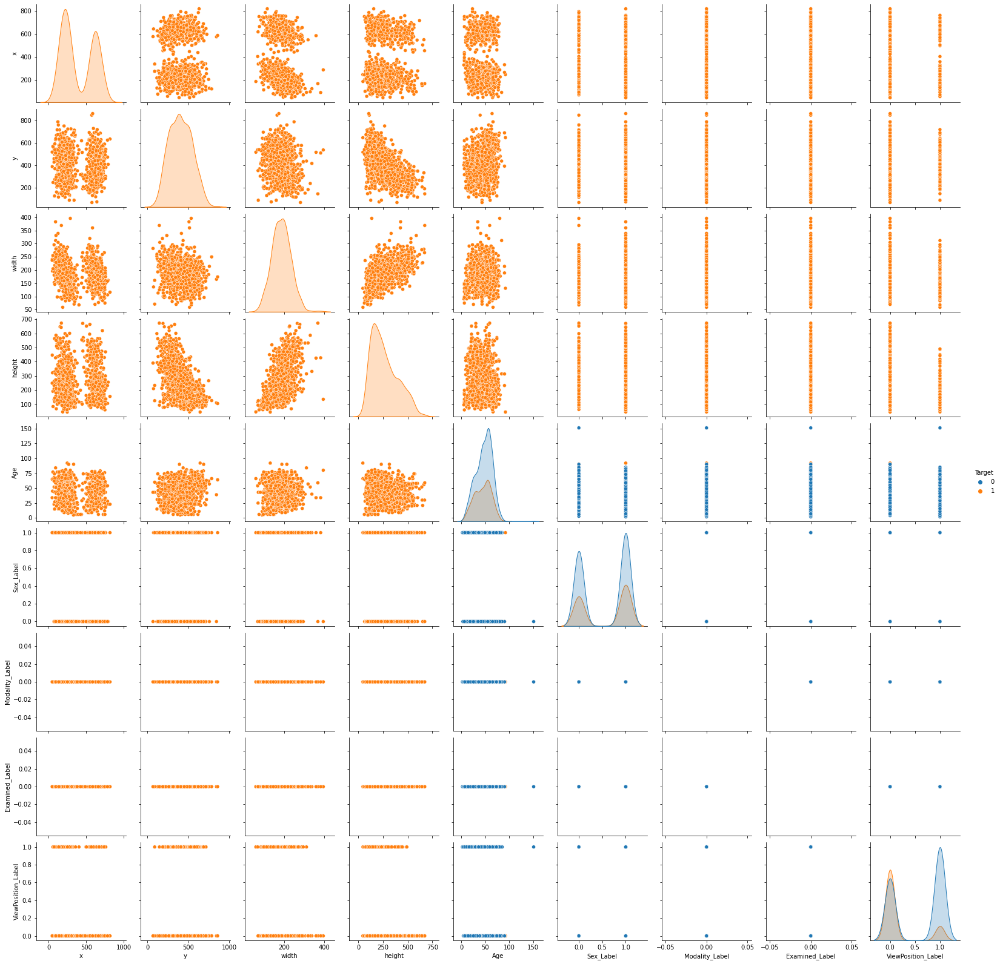

In [ ]:
sns.pairplot(X_X4, hue='Target',diag_kind='kde')

**Key Observations** 
- Age looks to be having Pneumonia infected patients of all age groups
- Sex both male and female are not so predictable but combining age and sex may give some interesting points
- View Position AP provides more Pneumonia reports than PA

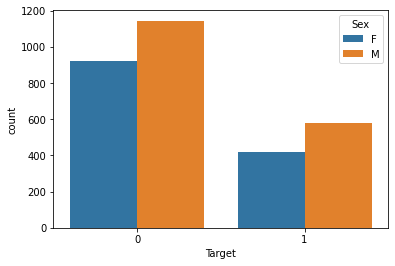

In [ ]:
sns.countplot(data=X_X4,x='Target',hue='Sex')

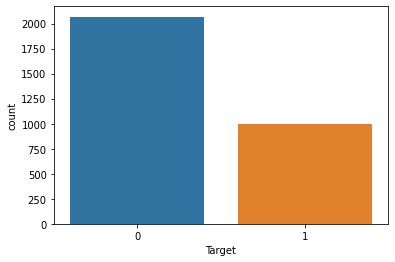

In [ ]:
sns.countplot(data=X_X4,x='Target')

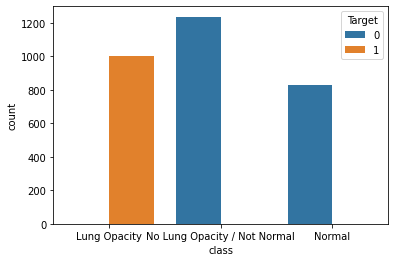

In [ ]:
sns.countplot(data=X_X4,x='class',hue='Target')

In [ ]:
X_X4['Modality'].unique() 

['CR']
Categories (1, object): ['CR']

In [ ]:
X_X4['Examined'].unique()

['CHEST']
Categories (1, object): ['CHEST']

In [ ]:
X_X4['ViewPosition'].unique()

['AP', 'PA']
Categories (2, object): ['AP', 'PA']

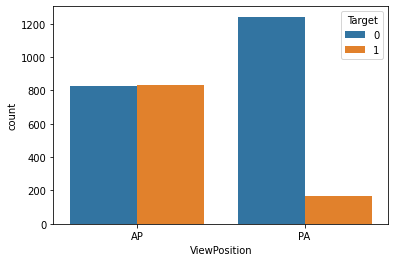

In [ ]:
sns.countplot(data=X_X4,x='ViewPosition',hue='Target')

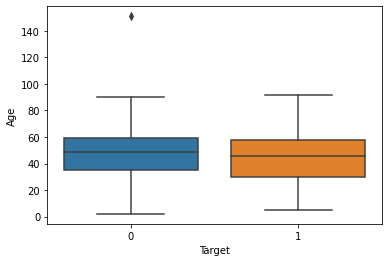

In [ ]:
sns.boxplot(x=X_X4['Target'],y=X_X4['Age'])

In [ ]:
Age_outlier=calOutliers(X_X4['Age'])
print(Age_outlier)

1


**Key Observations** 
- All age groups are impacted 
- Age has an outlier which can be safely ignored
- Males are more impacted than Female but not in big margin
- Impacted patients are about 1000 in numbers out of 3068 samples
- All records are with CR(Computed Radiography) modality so we can ignore this
- All records are with Chest examined so we can ignore this
- There are two view position categories such as AP and PA

### Hypothesis Checks
 - Age of certain range only has Pneumonia probabilities
    - O to 29
    - 30 to 60
    - Above 60
 - Men look more vulnerable for Pneumonia infection and severity
 - View position AP or PA significant for Pneumonia detection

#### Let's understand the Pneumonia impacts of age groups

In [ ]:
Check_Age_Factor(X_X4)

                Age 0 -29   Age 30 -60  Age above 60
Pneumonia      150.000000   400.000000    131.000000
Non Pneumonia  382.000000  1237.000000    449.000000
Impact Ratio    28.195489    24.434942     22.586207


#### Let's understand the difference between the pneumonia impacts over gender proportion

In [ ]:
Check_Gender_Factor(X_X4[X_X4['Sex_Label']==1],X_X4[X_X4['Sex_Label']==0])

z_stat=0.933583072172433, p_val=0.3505190006144575
Male and Female proportions are equal with Pneumonia
                      Male      Female
Pneumonia       391.000000  290.000000
Non Pneumonia  1145.000000  923.000000
Ratio            25.455729   23.907667


#### Let's check the proportion of view positions (AP, PA)

In [ ]:
Check_Viewpositions_Factor(X_X4[X_X4['ViewPosition_Label']==0],X_X4[X_X4['ViewPosition_Label']==1])

z_stat=17.681974131834572, p_val=5.773864339238331e-70
AP and PA view positions proportions are significantly varying with Pneumonia
                       AP          PA
Pneumonia      538.000000   143.00000
Non Pneumonia  826.000000  1242.00000
Ratio           39.442815    10.32491


#### **Key Observations**
- All age groups are impacted but patients with age group less than 30 are more impacted in proportions
- Pneumonia Impacted proportion within Age group: [0-29] ~28%, [30-60] ~24%, [Above 60] ~23%
- Male and Female Proportions within gender group of pneumonia impacts are looking very close to each other ~ 24% in each group
- View position AP looks to be more Pneumonia detecting position, suggested by ~39% within the sample taken with AP; whereas for PA it is about 10%

### X4 Data Insights
- All images  are of same size 1024
- Impacted patients are about 1000 in numbers out of 3068 samples
- All records are with CR(Computed Radiography) modality
- All records are with Chest examined 
- Bounding boxes won't be available for non-infected (or target value 0) patients
- No duplicates of patients between Pneumonia and Normal records
- All age groups are impacted but patients with age group less than 30 are more impacted in proportions
- Pneumonia Impacted proportion within Age group: [0-29] ~28%, [30-60] ~24%, [Above 60] ~23%
- Male and Female Proportions within gender group of pneumonia impacts are looking very close to each other ~ 24% in each group
- View position AP looks to be more Pneumonia detecting position, suggested by ~39% within the sample taken with AP; whereas for PA it is about 10%

## X5 - Batch ANALYSIS

In [ ]:
train_images_X5_files = list(get_files('./X5'))

### Pickling batch image files

In [ ]:
train_images_X5_pickle = open('./train_images_X5_pickle','wb')
pickle.dump(train_images_X5_files,train_images_X5_pickle)
train_images_X5_pickle.close()

### Loading batch image pickles

In [ ]:
train_images_X5_pickle = open('./train_images_X5_pickle','rb')
train_images_X5 = pickle.load(train_images_X5_pickle)

### Check the batch image size

In [ ]:
check_img_size(train_images_X5)

**Key Observations**
 - All images  are of same size 1024

### Combine Image Array data and labels

In [ ]:
X5_DICOM_metadata = extract_batch_DICOM_image_Data(train_images_X5,224)


In [ ]:
X_X5 = pd.merge(X5,X5_DICOM_metadata,how='inner', on='patientId')

#### Pickling the combined version of batch

In [ ]:
train_X5_comb_pickle = open('./train_X5_comb_pickle','wb')
pickle.dump(X_X5,train_X5_comb_pickle)
train_X5_comb_pickle.close()

### Loading the combined version of batch

In [ ]:
train_X5_comb_pickle = open('./train_X5_comb_pickle','rb')
X_X5 = pickle.load(train_X5_comb_pickle)

### Let's understand the dicom metadata such as Age, Sex, Modality, viewPosition, body part examined

In [ ]:
X_X5.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3068 entries, 0 to 3067
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   patientId     3068 non-null   object 
 1   class         3068 non-null   object 
 2   x             1000 non-null   float64
 3   y             1000 non-null   float64
 4   width         1000 non-null   float64
 5   height        1000 non-null   float64
 6   Target        3068 non-null   int64  
 7   Img_data      3068 non-null   object 
 8   Age           3068 non-null   object 
 9   Sex           3068 non-null   object 
 10  Modality      3068 non-null   object 
 11  Examined      3068 non-null   object 
 12  ViewPosition  3068 non-null   object 
dtypes: float64(4), int64(1), object(8)
memory usage: 335.6+ KB


**Key Observations**
 - DICOM metadata contains all as object types
 - Target variable is of int64
 - Bounding box values are following float64 type

In [ ]:
X_X5.isnull().sum()

patientId          0
class              0
x               2068
y               2068
width           2068
height          2068
Target             0
Img_data           0
Age                0
Sex                0
Modality           0
Examined           0
ViewPosition       0
dtype: int64

**Key Observations** 
 - Except x,y,height & width, rest are not null. It is understandable from our earlier data assessment that bounding boxes won't be available for non-infected (or target value 0) patients

### Let's change object type to int for number variables

In [ ]:
X_X5=X_X5.astype({"Age": int, "Sex": 'category',"ViewPosition":'category',"Modality":'category',"Examined":'category'})

### Label Encoding for categorical Variables

In [ ]:
labelencoder = LabelEncoder()
X_X5['Sex_Label']= labelencoder.fit_transform(X_X5['Sex'])
X_X5['Modality_Label']=labelencoder.fit_transform(X_X5['Modality'])
X_X5['Examined_Label']=labelencoder.fit_transform(X_X5['Examined'])
X_X5['ViewPosition_Label']=labelencoder.fit_transform(X_X5['ViewPosition'])

In [ ]:
X_X5.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3068 entries, 0 to 3067
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   patientId           3068 non-null   object  
 1   class               3068 non-null   object  
 2   x                   1000 non-null   float64 
 3   y                   1000 non-null   float64 
 4   width               1000 non-null   float64 
 5   height              1000 non-null   float64 
 6   Target              3068 non-null   int64   
 7   Img_data            3068 non-null   object  
 8   Age                 3068 non-null   int64   
 9   Sex                 3068 non-null   category
 10  Modality            3068 non-null   category
 11  Examined            3068 non-null   category
 12  ViewPosition        3068 non-null   category
 13  Sex_Label           3068 non-null   int64   
 14  Modality_Label      3068 non-null   int64   
 15  Examined_Label      3068 non-null   in

### Pickling with label encoding for categorical variables

In [ ]:
train_X_X5_comb_pickle = open('./train_X_X5_comb_pickle','wb')
pickle.dump(X_X5,train_X_X5_comb_pickle)
train_X_X5_comb_pickle.close()

### Loading the pickle  with label encoding for categorical variables

In [ ]:
train_X_X5_comb_pickle = open('./train_X_X5_comb_pickle','rb')
X_X5=pickle.load(train_X_X5_comb_pickle)

In [ ]:
X_X5.head(5)

,patientId,class,x,y,width,height,Target,Img_data,Age,Sex,Modality,Examined,ViewPosition,Sex_Label,Modality_Label,Examined_Label,ViewPosition_Label
0,819d6b1a-4e49-4fd6-8ac1-f7a9f355617e,Lung Opacity,752.0,265.0,228.0,379.0,1,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",26,M,CR,CHEST,AP,1,0,0,0
1,81a51c71-28ab-4a62-bb1b-458117d8234c,Lung Opacity,243.0,413.0,206.0,448.0,1,"[[155, 148, 142, 135, 131, 127, 125, 121, 120,...",59,M,CR,CHEST,PA,1,0,0,1
2,81b3ca12-841a-4c71-8fde-7fbcb835b6c9,Lung Opacity,646.0,331.0,289.0,294.0,1,"[[153, 100, 72, 58, 50, 47, 47, 53, 57, 61, 78...",33,M,CR,CHEST,PA,1,0,0,1
3,81bb8c21-7660-4f78-bcb7-1ceb2347f2a8,Lung Opacity,155.0,457.0,263.0,248.0,1,"[[170, 166, 161, 158, 154, 152, 150, 146, 142,...",51,F,CR,CHEST,AP,0,0,0,0
4,81bb8c21-7660-4f78-bcb7-1ceb2347f2a8,Lung Opacity,532.0,349.0,261.0,362.0,1,"[[170, 166, 161, 158, 154, 152, 150, 146, 142,...",51,F,CR,CHEST,AP,0,0,0,0


### Multi-variate Analysis

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

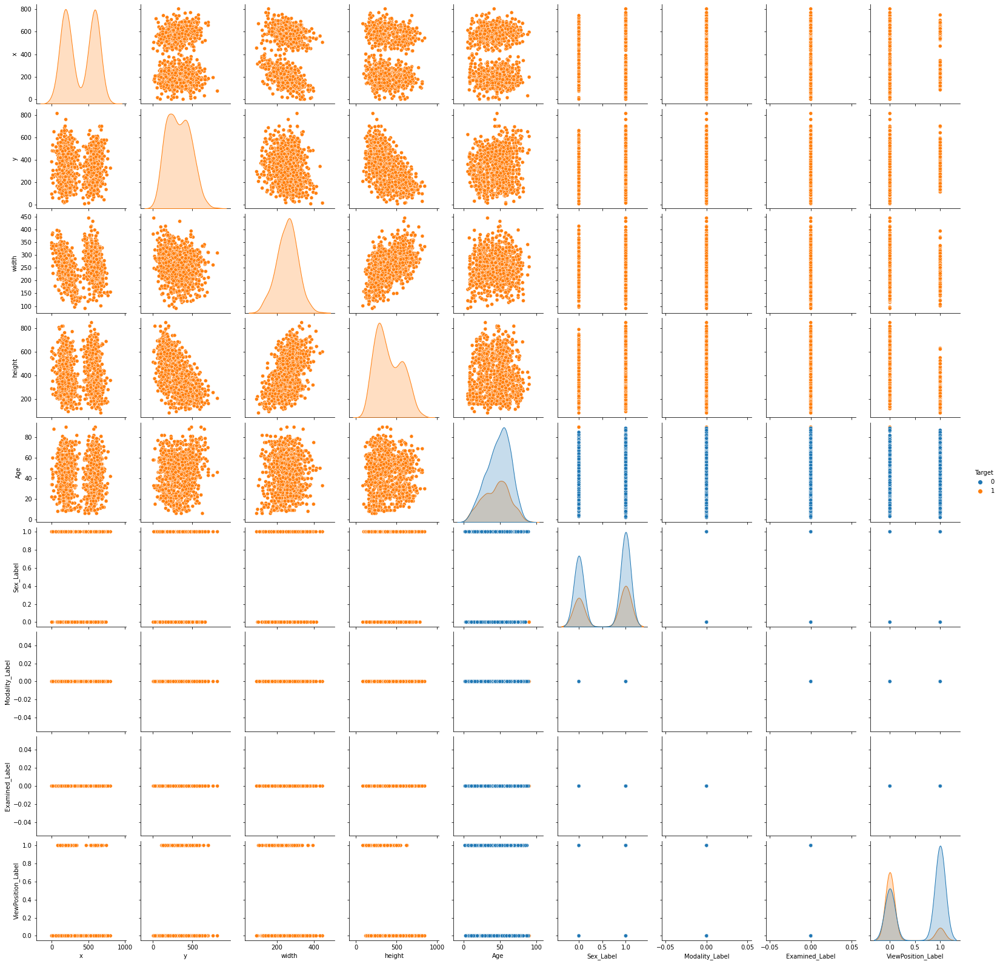

In [ ]:
sns.pairplot(X_X5, hue='Target',diag_kind='kde')

**Key Observations** 
- Age looks to be having Pneumonia infected patients of all age groups
- Sex both male and female are not so predictable but combining age and sex may give some interesting points
- View Position AP provides more Pneumonia reports than PA

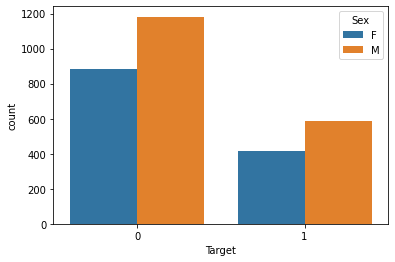

In [ ]:
sns.countplot(data=X_X5,x='Target',hue='Sex')

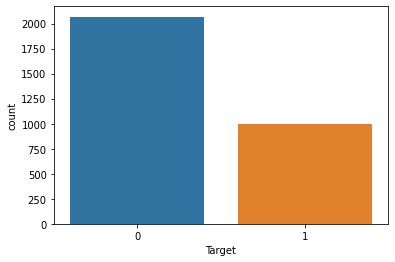

In [ ]:
sns.countplot(data=X_X5,x='Target')

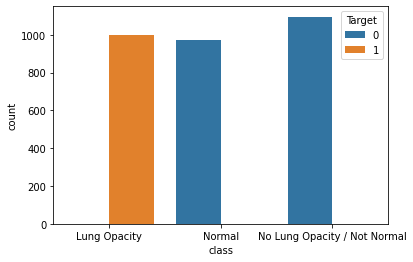

In [ ]:
sns.countplot(data=X_X5,x='class',hue='Target')

In [ ]:
X_X5['Modality'].unique() 

['CR']
Categories (1, object): ['CR']

In [ ]:
X_X5['Examined'].unique()

['CHEST']
Categories (1, object): ['CHEST']

In [ ]:
X_X5['ViewPosition'].unique()

['AP', 'PA']
Categories (2, object): ['AP', 'PA']

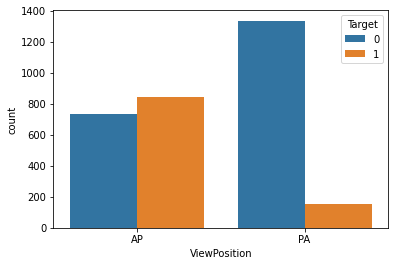

In [ ]:
sns.countplot(data=X_X5,x='ViewPosition',hue='Target')

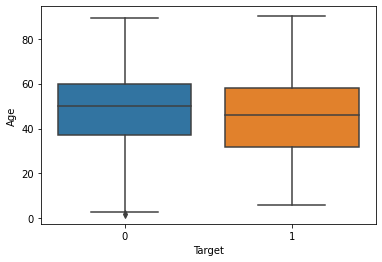

In [ ]:
sns.boxplot(x=X_X5['Target'],y=X_X5['Age'])

In [ ]:
Age_outlier=calOutliers(X_X5['Age'])
print(Age_outlier)

0


**Key Observations** 
- All age groups are impacted 
- Males are more impacted than Female but not in big margin
- Impacted patients are about 1000 in numbers out of 3068 samples
- All records are with CR(Computed Radiography) modality so we can ignore this
- All records are with Chest examined so we can ignore this
- There are two view position categories such as AP and PA

### Hypothesis Checks
 - Age of certain range only has Pneumonia probabilities
    - O to 29
    - 30 to 60
    - Above 60
 - Men look more vulnerable for Pneumonia infection and severity
 - View position AP or PA significant for Pneumonia detection

#### Let's understand the Pneumonia impacts of age groups

In [ ]:
Check_Age_Factor(X_X5)

                Age 0 -29  Age 30 -60  Age above 60
Pneumonia      127.000000   379.00000    120.000000
Non Pneumonia  313.000000  1274.00000    481.000000
Impact Ratio    28.863636    22.92801     19.966722


#### Let's understand the difference between the pneumonia impacts over gender proportion

In [ ]:
Check_Gender_Factor(X_X5[X_X5['Sex_Label']==1],X_X5[X_X5['Sex_Label']==0])

z_stat=0.7225622416054718, p_val=0.469948872941621
Male and Female proportions are equal with Pneumonia
                      Male      Female
Pneumonia       368.000000  258.000000
Non Pneumonia  1182.000000  886.000000
Ratio            23.741935   22.552448


#### Let's check the proportion of view positions (AP, PA)

In [ ]:
Check_Viewpositions_Factor(X_X5[X_X5['ViewPosition_Label']==0],X_X5[X_X5['ViewPosition_Label']==1])

z_stat=20.05398995522853, p_val=1.8628842179859867e-89
AP and PA view positions proportions are significantly varying with Pneumonia
                       AP           PA
Pneumonia      507.000000   119.000000
Non Pneumonia  732.000000  1336.000000
Ratio           40.920097     8.178694


#### **Key Observations**
- All age groups are impacted but patients with age group less than 30 are more impacted in proportions
- Pneumonia Impacted proportion within Age group: [0-29] ~29%, [30-60] ~23%, [Above 60] ~20%
- Male and Female Proportions within gender group of pneumonia impacts are looking very close to each other ~ 23% in each group
- View position AP looks to be more Pneumonia detecting position, suggested by ~40% within the sample taken with AP; whereas for PA it is about 8%

### X5 Data Insights
- All images  are of same size 1024
- Impacted patients are about 1000 in numbers out of 3068 samples
- All records are with CR(Computed Radiography) modality
- All records are with Chest examined 
- Bounding boxes won't be available for non-infected (or target value 0) patients
- No duplicates of patients between Pneumonia and Normal records
- All age groups are impacted but patients with age group less than 30 are more impacted in proportions
- Pneumonia Impacted proportion within Age group: [0-29] ~29%, [30-60] ~23%, [Above 60] ~20%
- Male and Female Proportions within gender group of pneumonia impacts are looking very close to each other ~ 23% in each group
- View position AP looks to be more Pneumonia detecting position, suggested by ~40% within the sample taken with AP; whereas for PA it is about 8%

## X6 - Batch ANALYSIS

In [ ]:
train_images_X6_files = list(get_files('./X6'))

### Pickling batch image files

In [ ]:
train_images_X6_pickle = open('./train_images_X6_pickle','wb')
pickle.dump(train_images_X6_files,train_images_X6_pickle)
train_images_X6_pickle.close()

### Loading batch image pickles

In [ ]:
train_images_X6_pickle = open('./train_images_X6_pickle','rb')
train_images_X6 = pickle.load(train_images_X6_pickle)

### Check the batch image size

In [ ]:
check_img_size(train_images_X6)

**Key Observations**
 - All images  are of same size 1024

### Combine Image Array data and labels

In [ ]:
X6_DICOM_metadata = extract_batch_DICOM_image_Data(train_images_X6,224)


In [ ]:
X_X6 = pd.merge(X6,X6_DICOM_metadata,how='inner', on='patientId')

#### Pickling the combined version of batch

In [ ]:
train_X6_comb_pickle = open('./train_X6_comb_pickle','wb')
pickle.dump(X_X6,train_X6_comb_pickle)
train_X6_comb_pickle.close()

### Loading the combined version of batch

In [ ]:
train_X6_comb_pickle = open('./train_X6_comb_pickle','rb')
X_X6 = pickle.load(train_X6_comb_pickle)

### Let's understand the dicom metadata such as Age, Sex, Modality, viewPosition, body part examined

In [ ]:
X_X6.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3068 entries, 0 to 3067
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   patientId     3068 non-null   object 
 1   class         3068 non-null   object 
 2   x             1000 non-null   float64
 3   y             1000 non-null   float64
 4   width         1000 non-null   float64
 5   height        1000 non-null   float64
 6   Target        3068 non-null   int64  
 7   Img_data      3068 non-null   object 
 8   Age           3068 non-null   object 
 9   Sex           3068 non-null   object 
 10  Modality      3068 non-null   object 
 11  Examined      3068 non-null   object 
 12  ViewPosition  3068 non-null   object 
dtypes: float64(4), int64(1), object(8)
memory usage: 335.6+ KB


**Key Observations**
 - DICOM metadata contains all as object types
 - Target variable is of int64
 - Bounding box values are following float64 type

In [ ]:
X_X6.isnull().sum()

patientId          0
class              0
x               2068
y               2068
width           2068
height          2068
Target             0
Img_data           0
Age                0
Sex                0
Modality           0
Examined           0
ViewPosition       0
dtype: int64

**Key Observations** 
 - Except x,y,height & width, rest are not null. It is understandable from our earlier data assessment that bounding boxes won't be available for non-infected (or target value 0) patients

### Let's change object type to int for number variables

In [ ]:
X_X6=X_X6.astype({"Age": int, "Sex": 'category',"ViewPosition":'category',"Modality":'category',"Examined":'category'})

### Label Encoding for categorical Variables

In [ ]:
labelencoder = LabelEncoder()
X_X6['Sex_Label']= labelencoder.fit_transform(X_X6['Sex'])
X_X6['Modality_Label']=labelencoder.fit_transform(X_X6['Modality'])
X_X6['Examined_Label']=labelencoder.fit_transform(X_X6['Examined'])
X_X6['ViewPosition_Label']=labelencoder.fit_transform(X_X6['ViewPosition'])

In [ ]:
X_X6.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3068 entries, 0 to 3067
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   patientId           3068 non-null   object  
 1   class               3068 non-null   object  
 2   x                   1000 non-null   float64 
 3   y                   1000 non-null   float64 
 4   width               1000 non-null   float64 
 5   height              1000 non-null   float64 
 6   Target              3068 non-null   int64   
 7   Img_data            3068 non-null   object  
 8   Age                 3068 non-null   int64   
 9   Sex                 3068 non-null   category
 10  Modality            3068 non-null   category
 11  Examined            3068 non-null   category
 12  ViewPosition        3068 non-null   category
 13  Sex_Label           3068 non-null   int64   
 14  Modality_Label      3068 non-null   int64   
 15  Examined_Label      3068 non-null   in

### Pickling with label encoding for categorical variables

In [ ]:
train_X_X6_comb_pickle = open('./train_X_X6_comb_pickle','wb')
pickle.dump(X_X6,train_X_X6_comb_pickle)
train_X_X6_comb_pickle.close()

### Loading the pickle  with label encoding for categorical variables

In [ ]:
train_X_X6_comb_pickle = open('./train_X_X6_comb_pickle','rb')
X_X6=pickle.load(train_X_X6_comb_pickle)

In [ ]:
X_X6.head(5)

,patientId,class,x,y,width,height,Target,Img_data,Age,Sex,Modality,Examined,ViewPosition,Sex_Label,Modality_Label,Examined_Label,ViewPosition_Label
0,9e61c568-6559-4634-b4af-7f1bbd8d39f0,Lung Opacity,194.0,295.0,261.0,429.0,1,"[[15, 14, 13, 14, 13, 13, 13, 14, 14, 14, 14, ...",56,F,CR,CHEST,AP,0,0,0,0
1,9e61c568-6559-4634-b4af-7f1bbd8d39f0,Lung Opacity,552.0,191.0,269.0,564.0,1,"[[15, 14, 13, 14, 13, 13, 13, 14, 14, 14, 14, ...",56,F,CR,CHEST,AP,0,0,0,0
2,9e6239f2-9352-4bad-a19a-22538ddd0e27,Lung Opacity,608.0,247.0,284.0,407.0,1,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",47,F,CR,CHEST,AP,0,0,0,0
3,9e6bd994-d868-4805-8511-08ddcbe33c14,Lung Opacity,506.0,181.0,366.0,709.0,1,"[[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,...",38,M,CR,CHEST,AP,1,0,0,0
4,9e6eb4fa-abd5-40a7-bd06-5ca016b16021,Lung Opacity,244.0,266.0,239.0,416.0,1,"[[0, 0, 0, 0, 2, 29, 13, 12, 11, 11, 11, 12, 1...",44,F,CR,CHEST,AP,0,0,0,0


### Multi-variate Analysis

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

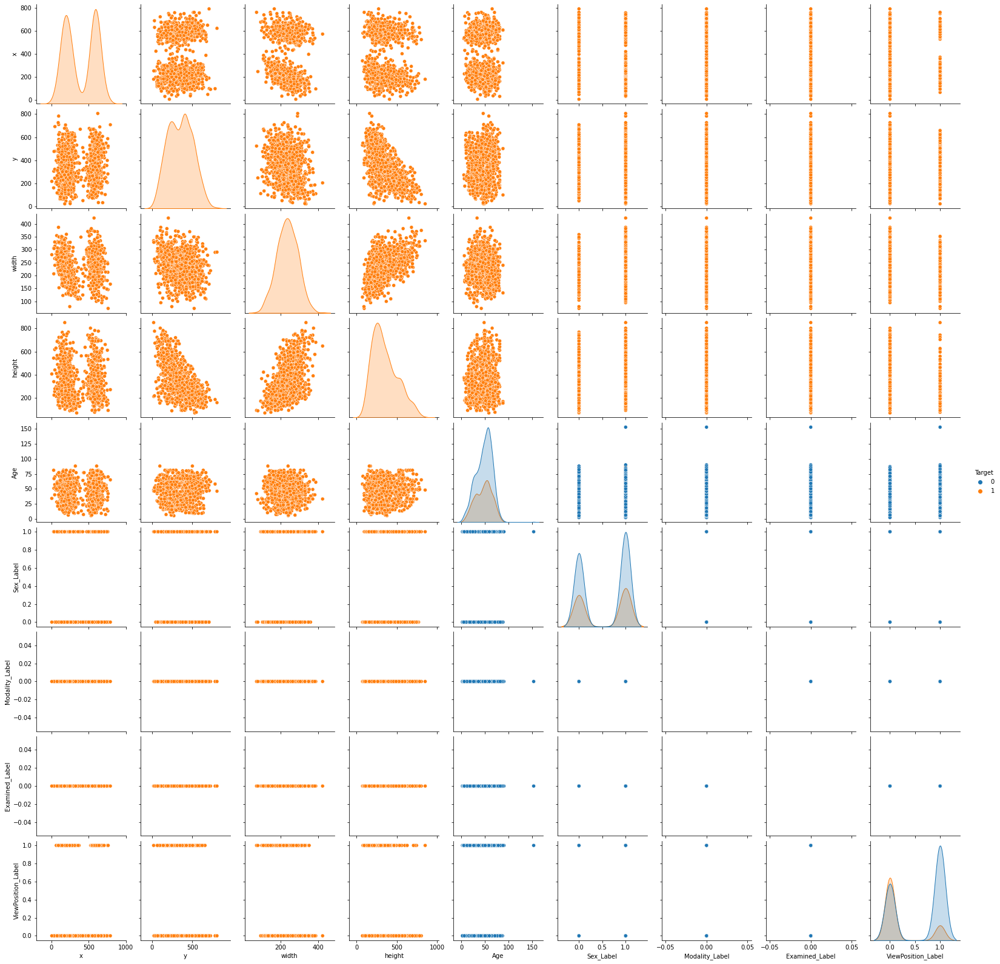

In [ ]:
sns.pairplot(X_X6, hue='Target',diag_kind='kde')

**Key Observations** 
- Age looks to be having Pneumonia infected patients of all age groups
- Sex both male and female are not so predictable but combining age and sex may give some interesting points
- View Position AP provides more Pneumonia reports than PA

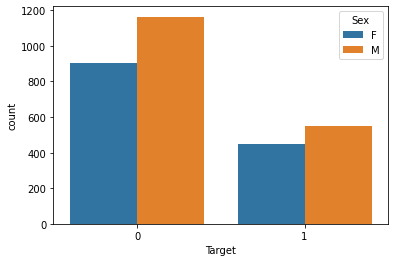

In [ ]:
sns.countplot(data=X_X6,x='Target',hue='Sex')

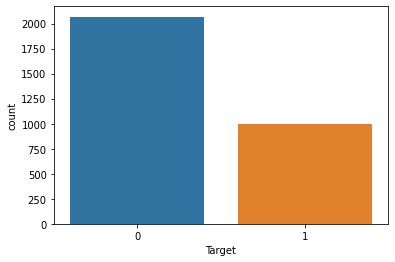

In [ ]:
sns.countplot(data=X_X6,x='Target')

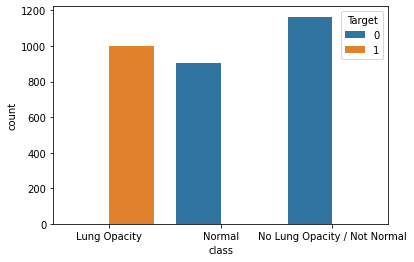

In [ ]:
sns.countplot(data=X_X6,x='class',hue='Target')

In [ ]:
X_X6['Modality'].unique() 

['CR']
Categories (1, object): ['CR']

In [ ]:
X_X6['Examined'].unique()

['CHEST']
Categories (1, object): ['CHEST']

In [ ]:
X_X6['ViewPosition'].unique()

['AP', 'PA']
Categories (2, object): ['AP', 'PA']

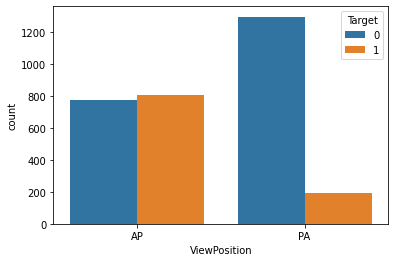

In [ ]:
sns.countplot(data=X_X6,x='ViewPosition',hue='Target')

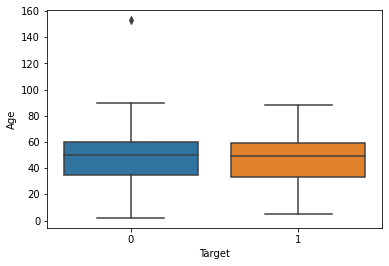

In [ ]:
sns.boxplot(x=X_X6['Target'],y=X_X6['Age'])

In [ ]:
Age_outlier=calOutliers(X_X6['Age'])
print(Age_outlier)

1


**Key Observations** 
- All age groups are impacted 
- Age has an outlier which can be safely ignored
- Males are more impacted than Female but not in big margin
- Impacted patients are about 1000 in numbers out of 3068 samples
- All records are with CR(Computed Radiography) modality so we can ignore this
- All records are with Chest examined so we can ignore this
- There are two view position categories such as AP and PA

### Hypothesis Checks
 - Age of certain range only has Pneumonia probabilities
    - O to 29
    - 30 to 60
    - Above 60
 - Men look more vulnerable for Pneumonia infection and severity
 - View position AP or PA significant for Pneumonia detection

#### Let's understand the Pneumonia impacts of age groups

In [ ]:
Check_Age_Factor(X_X6)

                Age 0 -29   Age 30 -60  Age above 60
Pneumonia      124.000000   375.000000    152.000000
Non Pneumonia  370.000000  1215.000000    483.000000
Impact Ratio    25.101215    23.584906     23.937008


#### Let's understand the difference between the pneumonia impacts over gender proportion

In [ ]:
Check_Gender_Factor(X_X6[X_X6['Sex_Label']==1],X_X6[X_X6['Sex_Label']==0])

z_stat=-0.37354227347289, p_val=0.7087448887109651
Male and Female proportions are equal with Pneumonia
                      Male      Female
Pneumonia       361.000000  290.000000
Non Pneumonia  1164.000000  904.000000
Ratio            23.672131   24.288107


#### Let's check the proportion of view positions (AP, PA)

In [ ]:
Check_Viewpositions_Factor(X_X6[X_X6['ViewPosition_Label']==0],X_X6[X_X6['ViewPosition_Label']==1])

z_stat=17.558981022312395, p_val=5.077859000717265e-69
AP and PA view positions proportions are significantly varying with Pneumonia
                       AP           PA
Pneumonia      500.000000   151.000000
Non Pneumonia  774.000000  1294.000000
Ratio           39.246468    10.449827


#### **Key Observations**
- All age groups are impacted but patients with age group less than 30 are more impacted in proportions
- Pneumonia Impacted proportion within Age group: [0-29] ~25%, [30-60] ~24%, [Above 60] ~24%
- Male and Female Proportions within gender group of pneumonia impacts are looking very close to each other ~ 24% in each group
- View position AP looks to be more Pneumonia detecting position, suggested by ~39% within the sample taken with AP; whereas for PA it is about 10%

### X6 Data Insights
- All images  are of same size 1024
- Impacted patients are about 1000 in numbers out of 3068 samples
- All records are with CR(Computed Radiography) modality
- All records are with Chest examined 
- Bounding boxes won't be available for non-infected (or target value 0) patients
- No duplicates of patients between Pneumonia and Normal records
- All age groups are impacted but patients with age group less than 30 are more impacted in proportions
- Pneumonia Impacted proportion within Age group: [0-29] ~25%, [30-60] ~24%, [Above 60] ~24%
- Male and Female Proportions within gender group of pneumonia impacts are looking very close to each other ~ 24% in each group
- View position AP looks to be more Pneumonia detecting position, suggested by ~39% within the sample taken with AP; whereas for PA it is about 10%

## X7 - Batch ANALYSIS

In [ ]:
train_images_X7_files = list(get_files('./X7'))

### Pickling batch image files

In [ ]:
train_images_X7_pickle = open('./train_images_X7_pickle','wb')
pickle.dump(train_images_X7_files,train_images_X7_pickle)
train_images_X7_pickle.close()

### Loading batch image pickles

In [ ]:
train_images_X7_pickle = open('./train_images_X7_pickle','rb')
train_images_X7 = pickle.load(train_images_X7_pickle)

### Check the batch image size

In [ ]:
check_img_size(train_images_X7)

**Key Observations**
 - All images  are of same size 1024

### Combine Image Array data and labels

In [ ]:
X7_DICOM_metadata = extract_batch_DICOM_image_Data(train_images_X7,224)


In [ ]:
X_X7 = pd.merge(X7,X7_DICOM_metadata,how='inner', on='patientId')

#### Pickling the combined version of batch

In [ ]:
train_X7_comb_pickle = open('./train_X7_comb_pickle','wb')
pickle.dump(X_X7,train_X7_comb_pickle)
train_X7_comb_pickle.close()

### Loading the combined version of batch

In [ ]:
train_X7_comb_pickle = open('./train_X7_comb_pickle','rb')
X_X7 = pickle.load(train_X7_comb_pickle)

### Let's understand the dicom metadata such as Age, Sex, Modality, viewPosition, body part examined

In [ ]:
X_X7.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3068 entries, 0 to 3067
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   patientId     3068 non-null   object 
 1   class         3068 non-null   object 
 2   x             1000 non-null   float64
 3   y             1000 non-null   float64
 4   width         1000 non-null   float64
 5   height        1000 non-null   float64
 6   Target        3068 non-null   int64  
 7   Img_data      3068 non-null   object 
 8   Age           3068 non-null   object 
 9   Sex           3068 non-null   object 
 10  Modality      3068 non-null   object 
 11  Examined      3068 non-null   object 
 12  ViewPosition  3068 non-null   object 
dtypes: float64(4), int64(1), object(8)
memory usage: 335.6+ KB


**Key Observations**
 - DICOM metadata contains all as object types
 - Target variable is of int64
 - Bounding box values are following float64 type

In [ ]:
X_X7.isnull().sum()

patientId          0
class              0
x               2068
y               2068
width           2068
height          2068
Target             0
Img_data           0
Age                0
Sex                0
Modality           0
Examined           0
ViewPosition       0
dtype: int64

**Key Observations** 
 - Except x,y,height & width, rest are not null. It is understandable from our earlier data assessment that bounding boxes won't be available for non-infected (or target value 0) patients

### Let's change object type to int for number variables

In [ ]:
X_X7=X_X7.astype({"Age": int, "Sex": 'category',"ViewPosition":'category',"Modality":'category',"Examined":'category'})

### Label Encoding for categorical Variables

In [ ]:
labelencoder = LabelEncoder()
X_X7['Sex_Label']= labelencoder.fit_transform(X_X7['Sex'])
X_X7['Modality_Label']=labelencoder.fit_transform(X_X7['Modality'])
X_X7['Examined_Label']=labelencoder.fit_transform(X_X7['Examined'])
X_X7['ViewPosition_Label']=labelencoder.fit_transform(X_X7['ViewPosition'])

In [ ]:
X_X7.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3068 entries, 0 to 3067
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   patientId           3068 non-null   object  
 1   class               3068 non-null   object  
 2   x                   1000 non-null   float64 
 3   y                   1000 non-null   float64 
 4   width               1000 non-null   float64 
 5   height              1000 non-null   float64 
 6   Target              3068 non-null   int64   
 7   Img_data            3068 non-null   object  
 8   Age                 3068 non-null   int64   
 9   Sex                 3068 non-null   category
 10  Modality            3068 non-null   category
 11  Examined            3068 non-null   category
 12  ViewPosition        3068 non-null   category
 13  Sex_Label           3068 non-null   int64   
 14  Modality_Label      3068 non-null   int64   
 15  Examined_Label      3068 non-null   in

### Pickling with label encoding for categorical variables

In [ ]:
train_X_X7_comb_pickle = open('./train_X_X7_comb_pickle','wb')
pickle.dump(X_X7,train_X_X7_comb_pickle)
train_X_X7_comb_pickle.close()

### Loading the pickle  with label encoding for categorical variables

In [ ]:
train_X_X7_comb_pickle = open('./train_X_X7_comb_pickle','rb')
X_X7=pickle.load(train_X_X7_comb_pickle)

In [ ]:
X_X7.head(5)

,patientId,class,x,y,width,height,Target,Img_data,Age,Sex,Modality,Examined,ViewPosition,Sex_Label,Modality_Label,Examined_Label,ViewPosition_Label
0,b0dbfa41-de0b-40f5-b635-3bdb73c620a6,Lung Opacity,532.0,417.0,226.0,478.0,1,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",45,M,CR,CHEST,AP,1,0,0,0
1,b0e1aaa6-9bd5-4ee3-832a-dd12e0486252,Lung Opacity,545.0,231.0,318.0,700.0,1,"[[1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 4, 2, 2,...",40,M,CR,CHEST,AP,1,0,0,0
2,b0e1aaa6-9bd5-4ee3-832a-dd12e0486252,Lung Opacity,205.0,293.0,226.0,401.0,1,"[[1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 4, 2, 2,...",40,M,CR,CHEST,AP,1,0,0,0
3,b0e2b584-8e6f-4849-88ad-778a07abc055,Lung Opacity,590.0,236.0,235.0,558.0,1,"[[5, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,...",50,F,CR,CHEST,AP,0,0,0,0
4,b0e2b584-8e6f-4849-88ad-778a07abc055,Lung Opacity,246.0,223.0,188.0,464.0,1,"[[5, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,...",50,F,CR,CHEST,AP,0,0,0,0


### Multi-variate Analysis

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

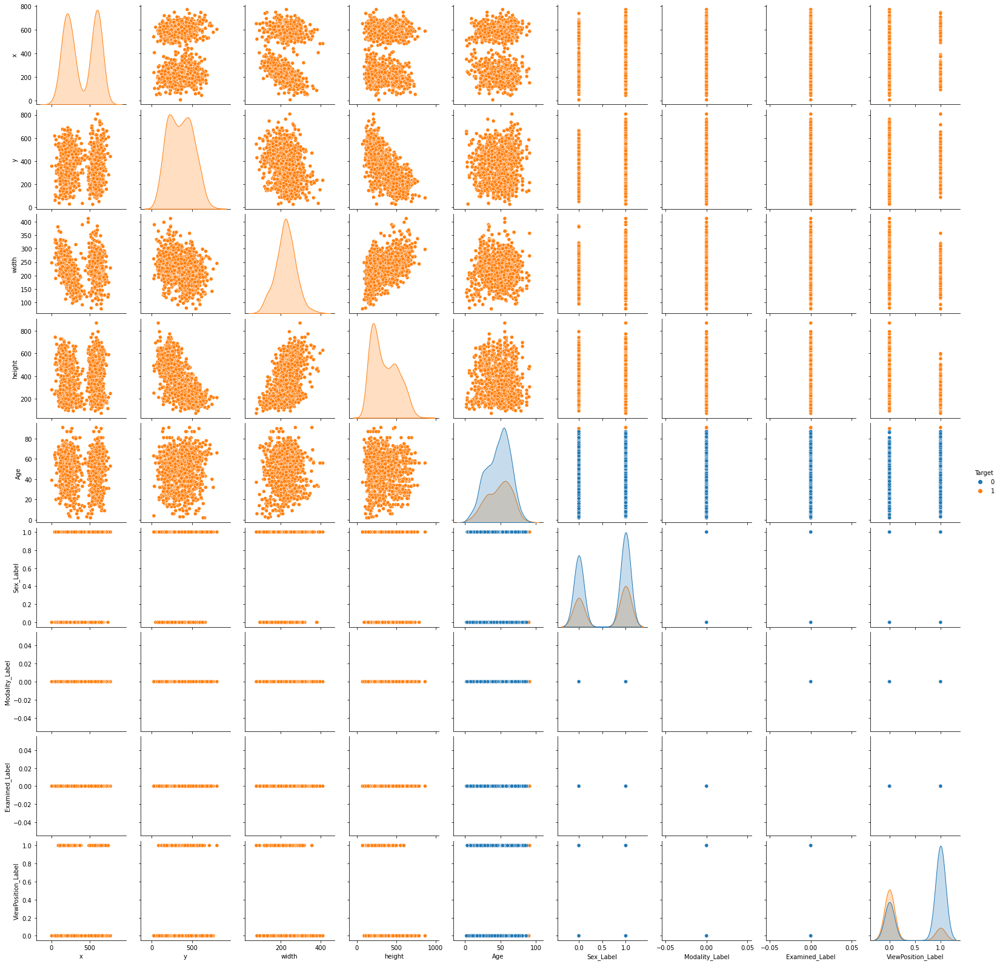

In [ ]:
sns.pairplot(X_X7, hue='Target',diag_kind='kde')

**Key Observations** 
- Age looks to be having Pneumonia infected patients of all age groups
- Sex both male and female are not so predictable but combining age and sex may give some interesting points
- View Position AP provides more Pneumonia reports than PA

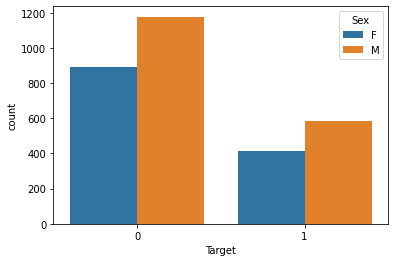

In [ ]:
sns.countplot(data=X_X7,x='Target',hue='Sex')

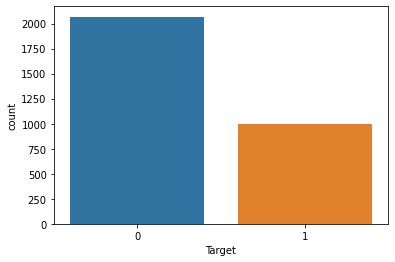

In [ ]:
sns.countplot(data=X_X7,x='Target')

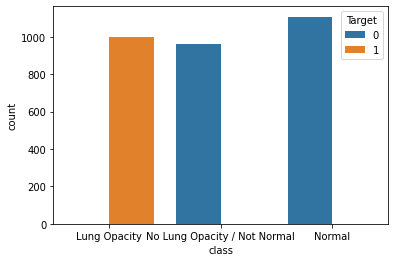

In [ ]:
sns.countplot(data=X_X7,x='class',hue='Target')

In [ ]:
X_X7['Modality'].unique() 

['CR']
Categories (1, object): ['CR']

In [ ]:
X_X7['Examined'].unique()

['CHEST']
Categories (1, object): ['CHEST']

In [ ]:
X_X7['ViewPosition'].unique()

['AP', 'PA']
Categories (2, object): ['AP', 'PA']

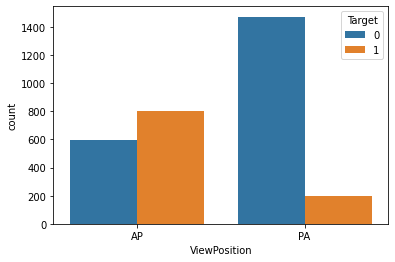

In [ ]:
sns.countplot(data=X_X7,x='ViewPosition',hue='Target')

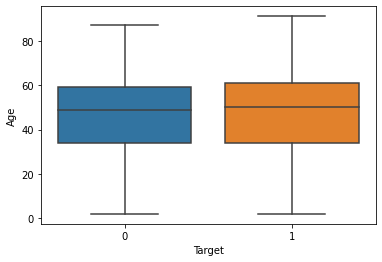

In [ ]:
sns.boxplot(x=X_X7['Target'],y=X_X7['Age'])

In [ ]:
Age_outlier=calOutliers(X_X7['Age'])
print(Age_outlier)

0


**Key Observations** 
- All age groups are impacted 
- Males are more impacted than Female but not in big margin
- Impacted patients are about 1000 in numbers out of 3068 samples
- All records are with CR(Computed Radiography) modality so we can ignore this
- All records are with Chest examined so we can ignore this
- There are two view position categories such as AP and PA

### Hypothesis Checks
 - Age of certain range only has Pneumonia probabilities
    - O to 29
    - 30 to 60
    - Above 60
 - Men look more vulnerable for Pneumonia infection and severity
 - View position AP or PA significant for Pneumonia detection

#### Let's understand the Pneumonia impacts of age groups

In [ ]:
Check_Age_Factor(X_X7)

                Age 0 -29   Age 30 -60  Age above 60
Pneumonia       99.000000   328.000000    154.000000
Non Pneumonia  374.000000  1237.000000    457.000000
Impact Ratio    20.930233    20.958466     25.204583


#### Let's understand the difference between the pneumonia impacts over gender proportion

In [ ]:
Check_Gender_Factor(X_X7[X_X7['Sex_Label']==1],X_X7[X_X7['Sex_Label']==0])

z_stat=0.4477187910369422, p_val=0.6543561583816035
Male and Female proportions are equal with Pneumonia
                      Male      Female
Pneumonia       337.000000  244.000000
Non Pneumonia  1178.000000  890.000000
Ratio            22.244224   21.516755


#### Let's check the proportion of view positions (AP, PA)

In [ ]:
Check_Viewpositions_Factor(X_X7[X_X7['ViewPosition_Label']==0],X_X7[X_X7['ViewPosition_Label']==1])

z_stat=20.78404859618589, p_val=6.034856398226085e-96
AP and PA view positions proportions are significantly varying with Pneumonia
                       AP           PA
Pneumonia      444.000000   137.000000
Non Pneumonia  595.000000  1473.000000
Ratio           42.733397     8.509317


#### **Key Observations**
- All age groups are impacted but patients with age group greater than 60 are more impacted in proportions
- Pneumonia Impacted proportion within Age group: [0-29] ~21%, [30-60] ~21%, [Above 60] ~25%
- Male and Female Proportions within gender group of pneumonia impacts are looking very close to each other ~ 22% in each group
- View position AP looks to be more Pneumonia detecting position, suggested by ~42% within the sample taken with AP; whereas for PA it is about 9%

### X7 Data Insights
- All images  are of same size 1024
- Impacted patients are about 1000 in numbers out of 3068 samples
- All records are with CR(Computed Radiography) modality
- All records are with Chest examined 
- Bounding boxes won't be available for non-infected (or target value 0) patients
- No duplicates of patients between Pneumonia and Normal records
- All age groups are impacted but patients with age group greater than 60 are more impacted in proportions
- Pneumonia Impacted proportion within Age group: [0-29] ~21%, [30-60] ~21%, [Above 60] ~25%
- Male and Female Proportions within gender group of pneumonia impacts are looking very close to each other ~ 22% in each group
- View position AP looks to be more Pneumonia detecting position, suggested by ~42% within the sample taken with AP; whereas for PA it is about 9%

## X8 - Batch ANALYSIS

In [ ]:
train_images_X8_files = list(get_files('./X8'))

### Pickling batch image files

In [ ]:
train_images_X8_pickle = open('./train_images_X8_pickle','wb')
pickle.dump(train_images_X8_files,train_images_X8_pickle)
train_images_X8_pickle.close()

### Loading batch image pickles

In [ ]:
train_images_X8_pickle = open('./train_images_X8_pickle','rb')
train_images_X8 = pickle.load(train_images_X8_pickle)

### Check the batch image size

In [ ]:
check_img_size(train_images_X8)

**Key Observations**
 - All images  are of same size 1024

### Combine Image Array data and labels

In [ ]:
X8_DICOM_metadata = extract_batch_DICOM_image_Data(train_images_X8,224)


In [ ]:
X_X8 = pd.merge(X8,X8_DICOM_metadata,how='inner', on='patientId')

#### Pickling the combined version of batch

In [ ]:
train_X8_comb_pickle = open('./train_X8_comb_pickle','wb')
pickle.dump(X_X8,train_X8_comb_pickle)
train_X8_comb_pickle.close()

### Loading the combined version of batch

In [ ]:
train_X8_comb_pickle = open('./train_X8_comb_pickle','rb')
X_X8 = pickle.load(train_X8_comb_pickle)

### Let's understand the dicom metadata such as Age, Sex, Modality, viewPosition, body part examined

In [ ]:
X_X8.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3068 entries, 0 to 3067
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   patientId     3068 non-null   object 
 1   class         3068 non-null   object 
 2   x             1000 non-null   float64
 3   y             1000 non-null   float64
 4   width         1000 non-null   float64
 5   height        1000 non-null   float64
 6   Target        3068 non-null   int64  
 7   Img_data      3068 non-null   object 
 8   Age           3068 non-null   object 
 9   Sex           3068 non-null   object 
 10  Modality      3068 non-null   object 
 11  Examined      3068 non-null   object 
 12  ViewPosition  3068 non-null   object 
dtypes: float64(4), int64(1), object(8)
memory usage: 335.6+ KB


**Key Observations**
 - DICOM metadata contains all as object types
 - Target variable is of int64
 - Bounding box values are following float64 type

In [ ]:
X_X8.isnull().sum()

patientId          0
class              0
x               2068
y               2068
width           2068
height          2068
Target             0
Img_data           0
Age                0
Sex                0
Modality           0
Examined           0
ViewPosition       0
dtype: int64

**Key Observations** 
 - Except x,y,height & width, rest are not null. It is understandable from our earlier data assessment that bounding boxes won't be available for non-infected (or target value 0) patients

### Let's change object type to int for number variables

In [ ]:
X_X8=X_X8.astype({"Age": int, "Sex": 'category',"ViewPosition":'category',"Modality":'category',"Examined":'category'})

### Label Encoding for categorical Variables

In [ ]:
labelencoder = LabelEncoder()
X_X8['Sex_Label']= labelencoder.fit_transform(X_X8['Sex'])
X_X8['Modality_Label']=labelencoder.fit_transform(X_X8['Modality'])
X_X8['Examined_Label']=labelencoder.fit_transform(X_X8['Examined'])
X_X8['ViewPosition_Label']=labelencoder.fit_transform(X_X8['ViewPosition'])

In [ ]:
X_X8.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3068 entries, 0 to 3067
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   patientId           3068 non-null   object  
 1   class               3068 non-null   object  
 2   x                   1000 non-null   float64 
 3   y                   1000 non-null   float64 
 4   width               1000 non-null   float64 
 5   height              1000 non-null   float64 
 6   Target              3068 non-null   int64   
 7   Img_data            3068 non-null   object  
 8   Age                 3068 non-null   int64   
 9   Sex                 3068 non-null   category
 10  Modality            3068 non-null   category
 11  Examined            3068 non-null   category
 12  ViewPosition        3068 non-null   category
 13  Sex_Label           3068 non-null   int64   
 14  Modality_Label      3068 non-null   int64   
 15  Examined_Label      3068 non-null   in

### Pickling with label encoding for categorical variables

In [ ]:
train_X_X8_comb_pickle = open('./train_X_X8_comb_pickle','wb')
pickle.dump(X_X8,train_X_X8_comb_pickle)
train_X_X8_comb_pickle.close()

### Loading the pickle  with label encoding for categorical variables

In [ ]:
train_X_X8_comb_pickle = open('./train_X_X8_comb_pickle','rb')
X_X8=pickle.load(train_X_X8_comb_pickle)

In [ ]:
X_X8.head(5)

,patientId,class,x,y,width,height,Target,Img_data,Age,Sex,Modality,Examined,ViewPosition,Sex_Label,Modality_Label,Examined_Label,ViewPosition_Label
0,bc3874a9-9bcc-4156-ad10-b3ba0ec3d370,Lung Opacity,549.0,312.0,270.0,439.0,1,"[[1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,...",44,M,CR,CHEST,AP,1,0,0,0
1,bc407298-ee2e-4723-b4ec-58f4603ce88d,Lung Opacity,540.0,388.0,288.0,276.0,1,"[[119, 122, 123, 121, 123, 124, 123, 123, 124,...",31,F,CR,CHEST,AP,0,0,0,0
2,bc41e91e-506d-4ff9-8dba-3fd085f38491,Lung Opacity,262.0,303.0,288.0,557.0,1,"[[2, 3, 2, 2, 3, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3,...",66,M,CR,CHEST,AP,1,0,0,0
3,bc41e91e-506d-4ff9-8dba-3fd085f38491,Lung Opacity,707.0,278.0,269.0,582.0,1,"[[2, 3, 2, 2, 3, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3,...",66,M,CR,CHEST,AP,1,0,0,0
4,bc43dbd7-03e5-450d-aa3c-d0efed12a8f9,Lung Opacity,633.0,646.0,228.0,204.0,1,"[[126, 137, 130, 123, 115, 103, 93, 82, 75, 64...",54,M,CR,CHEST,AP,1,0,0,0


### Multi-variate Analysis

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

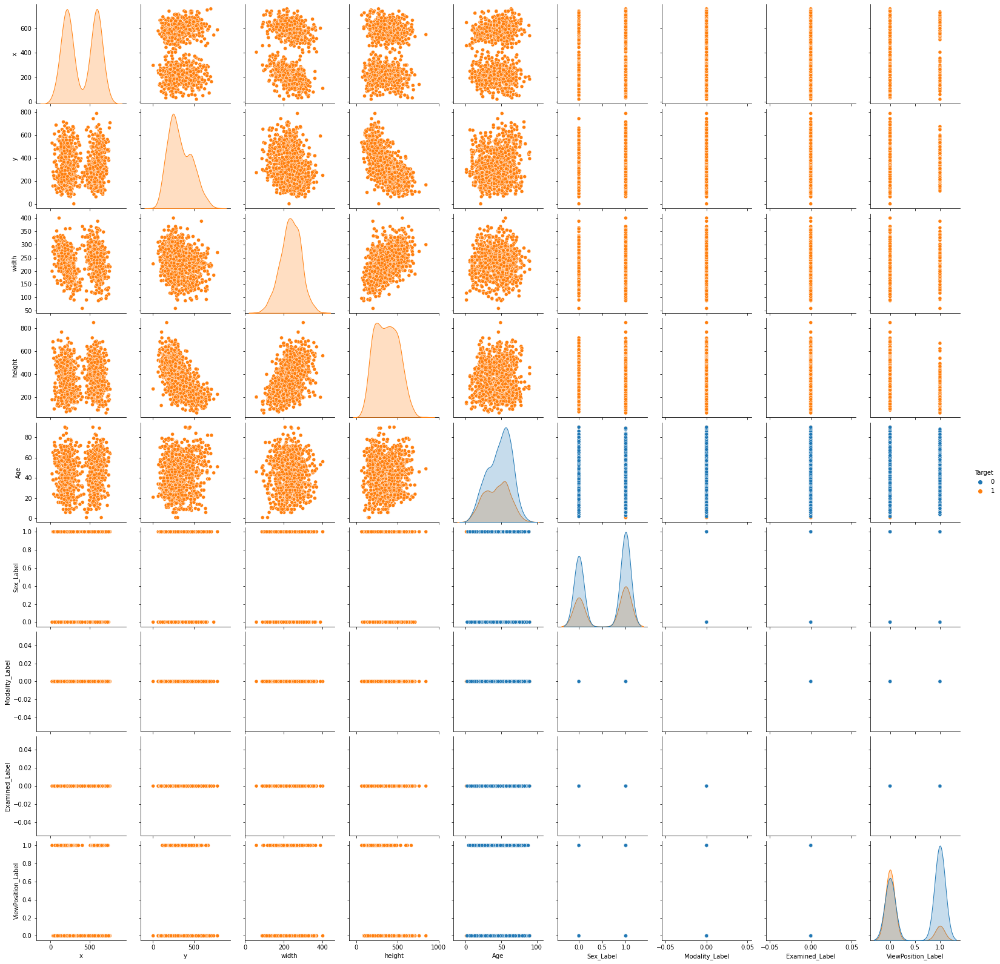

In [ ]:
sns.pairplot(X_X8, hue='Target',diag_kind='kde')

**Key Observations** 
- Age looks to be having Pneumonia infected patients of all age groups
- Sex both male and female are not so predictable but combining age and sex may give some interesting points
- View Position AP provides more Pneumonia reports than PA

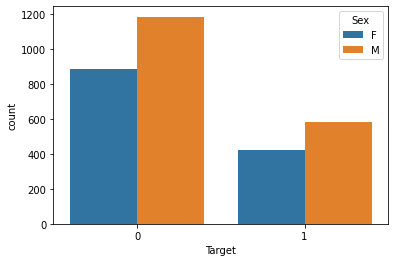

In [ ]:
sns.countplot(data=X_X8,x='Target',hue='Sex')

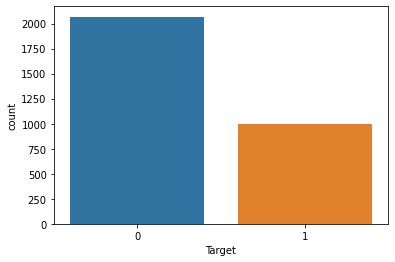

In [ ]:
sns.countplot(data=X_X8,x='Target')

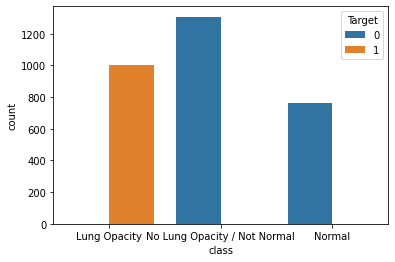

In [ ]:
sns.countplot(data=X_X8,x='class',hue='Target')

In [ ]:
X_X8['Modality'].unique() 

['CR']
Categories (1, object): ['CR']

In [ ]:
X_X8['Examined'].unique()

['CHEST']
Categories (1, object): ['CHEST']

In [ ]:
X_X8['ViewPosition'].unique()

['AP', 'PA']
Categories (2, object): ['AP', 'PA']

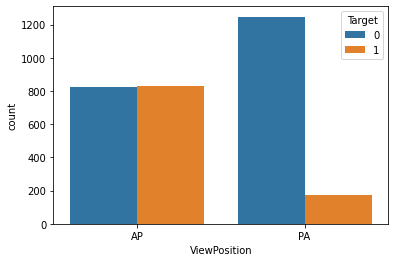

In [ ]:
sns.countplot(data=X_X8,x='ViewPosition',hue='Target')

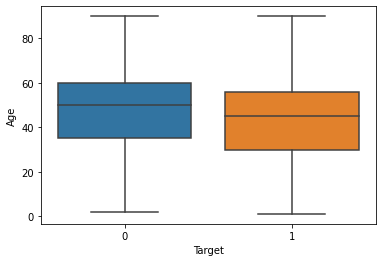

In [ ]:
sns.boxplot(x=X_X8['Target'],y=X_X8['Age'])

In [ ]:
Age_outlier=calOutliers(X_X8['Age'])
print(Age_outlier)

0


**Key Observations** 
- All age groups are impacted 
- Males are more impacted than Female but not in big margin
- Impacted patients are about 1000 in numbers out of 3068 samples
- All records are with CR(Computed Radiography) modality so we can ignore this
- All records are with Chest examined so we can ignore this
- There are two view position categories such as AP and PA

### Hypothesis Checks
 - Age of certain range only has Pneumonia probabilities
    - O to 29
    - 30 to 60
    - Above 60
 - Men look more vulnerable for Pneumonia infection and severity
 - View position AP or PA significant for Pneumonia detection

#### Let's understand the Pneumonia impacts of age groups

In [ ]:
Check_Age_Factor(X_X8)

                Age 0 -29   Age 30 -60  Age above 60
Pneumonia      148.000000   359.000000     110.00000
Non Pneumonia  354.000000  1225.000000     489.00000
Impact Ratio    29.482072    22.664141      18.36394


#### Let's understand the difference between the pneumonia impacts over gender proportion

In [ ]:
Check_Gender_Factor(X_X8[X_X8['Sex_Label']==1],X_X8[X_X8['Sex_Label']==0])

z_stat=0.3604534375106132, p_val=0.7185080710620635
Male and Female proportions are equal with Pneumonia
                      Male     Female
Pneumonia       358.000000  259.00000
Non Pneumonia  1183.000000  885.00000
Ratio            23.231668   22.63986


#### Let's check the proportion of view positions (AP, PA)

In [ ]:
Check_Viewpositions_Factor(X_X8[X_X8['ViewPosition_Label']==0],X_X8[X_X8['ViewPosition_Label']==1])

z_stat=17.10955554504095, p_val=1.2595692063257738e-65
AP and PA view positions proportions are significantly varying with Pneumonia
                       AP           PA
Pneumonia      487.000000   130.000000
Non Pneumonia  821.000000  1247.000000
Ratio           37.232416     9.440813


#### **Key Observations**
- All age groups are impacted but patients with age group less than 30 are more impacted in proportions
- Pneumonia Impacted proportion within Age group: [0-29] ~29%, [30-60] ~23%, [Above 60] ~18%
- Male and Female Proportions within gender group of pneumonia impacts are looking very close to each other ~ 23% in each group
- View position AP looks to be more Pneumonia detecting position, suggested by ~37% within the sample taken with AP; whereas for PA it is about 9%

### X8 Data Insights
- All images  are of same size 1024
- Impacted patients are about 1000 in numbers out of 3068 samples
- All records are with CR(Computed Radiography) modality
- All records are with Chest examined 
- Bounding boxes won't be available for non-infected (or target value 0) patients
- No duplicates of patients between Pneumonia and Normal records
- All age groups are impacted but patients with age group less than 30 are more impacted in proportions
- Pneumonia Impacted proportion within Age group: [0-29] ~29%, [30-60] ~23%, [Above 60] ~18%
- Male and Female Proportions within gender group of pneumonia impacts are looking very close to each other ~ 23% in each group
- View position AP looks to be more Pneumonia detecting position, suggested by ~37% within the sample taken with AP; whereas for PA it is about 9%

## X9 - Batch ANALYSIS

In [ ]:
train_images_X9_files = list(get_files('./X9'))

### Pickling batch image files

In [ ]:
train_images_X9_pickle = open('./train_images_X9_pickle','wb')
pickle.dump(train_images_X9_files,train_images_X9_pickle)
train_images_X9_pickle.close()

### Loading batch image pickles

In [ ]:
train_images_X9_pickle = open('./train_images_X9_pickle','rb')
train_images_X9 = pickle.load(train_images_X9_pickle)

### Check the batch image size

In [ ]:
check_img_size(train_images_X9)

**Key Observations**
 - All images  are of same size 1024

### Combine Image Array data and labels

In [ ]:
X9_DICOM_metadata = extract_batch_DICOM_image_Data(train_images_X9,224)


In [ ]:
X_X9 = pd.merge(X9,X9_DICOM_metadata,how='inner', on='patientId')

#### Pickling the combined version of batch

In [ ]:
train_X9_comb_pickle = open('./train_X9_comb_pickle','wb')
pickle.dump(X_X9,train_X9_comb_pickle)
train_X9_comb_pickle.close()

### Loading the combined version of batch

In [ ]:
train_X9_comb_pickle = open('./train_X9_comb_pickle','rb')
X_X9 = pickle.load(train_X9_comb_pickle)

### Let's understand the dicom metadata such as Age, Sex, Modality, viewPosition, body part examined

In [ ]:
X_X9.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3068 entries, 0 to 3067
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   patientId     3068 non-null   object 
 1   class         3068 non-null   object 
 2   x             1000 non-null   float64
 3   y             1000 non-null   float64
 4   width         1000 non-null   float64
 5   height        1000 non-null   float64
 6   Target        3068 non-null   int64  
 7   Img_data      3068 non-null   object 
 8   Age           3068 non-null   object 
 9   Sex           3068 non-null   object 
 10  Modality      3068 non-null   object 
 11  Examined      3068 non-null   object 
 12  ViewPosition  3068 non-null   object 
dtypes: float64(4), int64(1), object(8)
memory usage: 335.6+ KB


**Key Observations**
 - DICOM metadata contains all as object types
 - Target variable is of int64
 - Bounding box values are following float64 type

In [ ]:
X_X9.isnull().sum()

patientId          0
class              0
x               2068
y               2068
width           2068
height          2068
Target             0
Img_data           0
Age                0
Sex                0
Modality           0
Examined           0
ViewPosition       0
dtype: int64

**Key Observations** 
 - Except x,y,height & width, rest are not null. It is understandable from our earlier data assessment that bounding boxes won't be available for non-infected (or target value 0) patients

### Let's change object type to int for number variables

In [ ]:
X_X9=X_X9.astype({"Age": int, "Sex": 'category',"ViewPosition":'category',"Modality":'category',"Examined":'category'})

### Label Encoding for categorical Variables

In [ ]:
labelencoder = LabelEncoder()
X_X9['Sex_Label']= labelencoder.fit_transform(X_X9['Sex'])
X_X9['Modality_Label']=labelencoder.fit_transform(X_X9['Modality'])
X_X9['Examined_Label']=labelencoder.fit_transform(X_X9['Examined'])
X_X9['ViewPosition_Label']=labelencoder.fit_transform(X_X9['ViewPosition'])

In [ ]:
X_X9.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3068 entries, 0 to 3067
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   patientId           3068 non-null   object  
 1   class               3068 non-null   object  
 2   x                   1000 non-null   float64 
 3   y                   1000 non-null   float64 
 4   width               1000 non-null   float64 
 5   height              1000 non-null   float64 
 6   Target              3068 non-null   int64   
 7   Img_data            3068 non-null   object  
 8   Age                 3068 non-null   int64   
 9   Sex                 3068 non-null   category
 10  Modality            3068 non-null   category
 11  Examined            3068 non-null   category
 12  ViewPosition        3068 non-null   category
 13  Sex_Label           3068 non-null   int64   
 14  Modality_Label      3068 non-null   int64   
 15  Examined_Label      3068 non-null   in

### Pickling with label encoding for categorical variables

In [ ]:
train_X_X9_comb_pickle = open('./train_X_X9_comb_pickle','wb')
pickle.dump(X_X9,train_X_X9_comb_pickle)
train_X_X9_comb_pickle.close()

### Loading the pickle  with label encoding for categorical variables

In [ ]:
train_X_X9_comb_pickle = open('./train_X_X9_comb_pickle','rb')
X_X9=pickle.load(train_X_X9_comb_pickle)

In [ ]:
X_X9.head(5)

,patientId,class,x,y,width,height,Target,Img_data,Age,Sex,Modality,Examined,ViewPosition,Sex_Label,Modality_Label,Examined_Label,ViewPosition_Label
0,d84a14db-b31a-45f6-83de-5323036f823c,Lung Opacity,608.0,345.0,180.0,220.0,1,"[[2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,...",25,M,CR,CHEST,AP,1,0,0,0
1,d84d271a-8ea1-4065-90e5-9f9c94794310,Lung Opacity,182.0,505.0,171.0,156.0,1,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",16,M,CR,CHEST,AP,1,0,0,0
2,d85118d0-c7de-4397-a6da-b60ff8a249f0,Lung Opacity,552.0,340.0,218.0,358.0,1,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",58,F,CR,CHEST,AP,0,0,0,0
3,d85118d0-c7de-4397-a6da-b60ff8a249f0,Lung Opacity,147.0,290.0,216.0,443.0,1,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",58,F,CR,CHEST,AP,0,0,0,0
4,d877d8be-7d38-43aa-b359-bd86cf3951c3,Lung Opacity,140.0,363.0,206.0,288.0,1,"[[0, 26, 24, 24, 23, 23, 22, 21, 22, 22, 21, 2...",36,F,CR,CHEST,AP,0,0,0,0


### Multi-variate Analysis

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

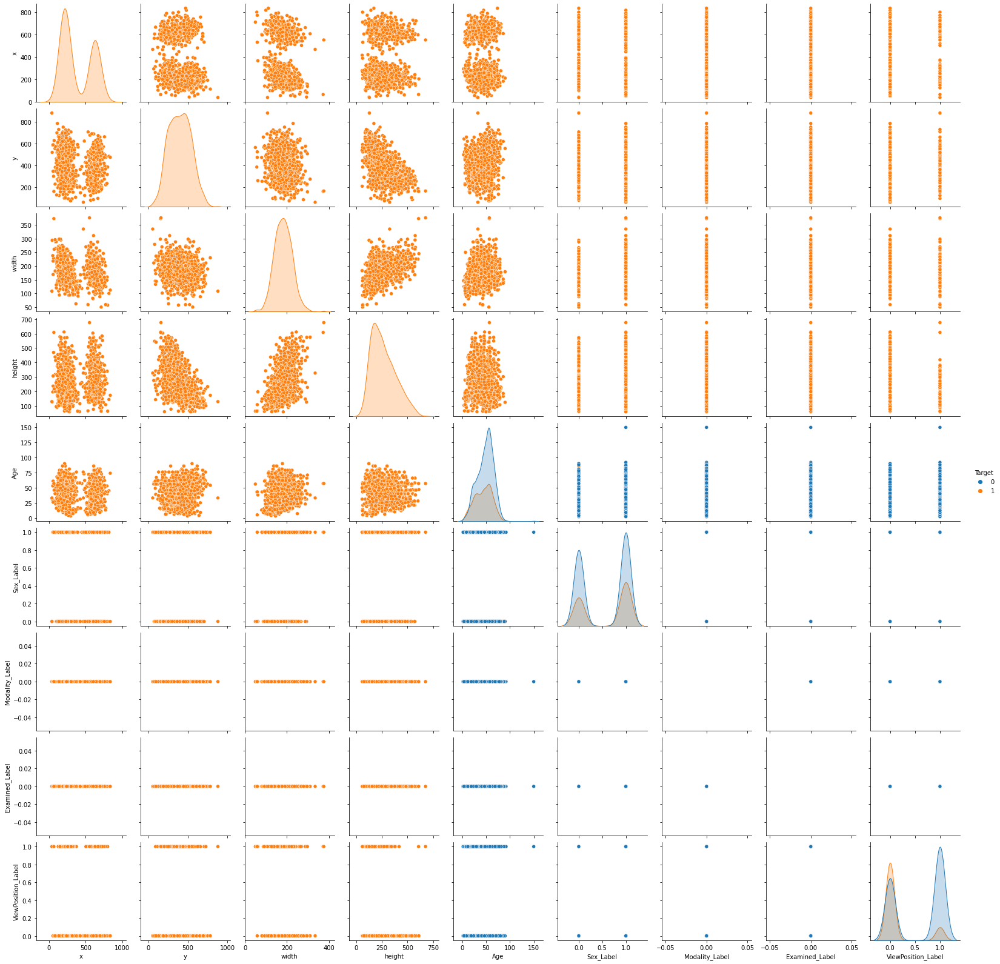

In [ ]:
sns.pairplot(X_X9, hue='Target',diag_kind='kde')

**Key Observations** 
- Age looks to be having Pneumonia infected patients of all age groups
- Sex both male and female are not so predictable but combining age and sex may give some interesting points
- View Position AP provides more Pneumonia reports than PA

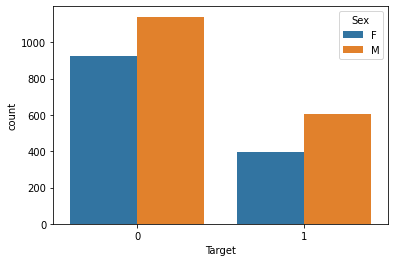

In [ ]:
sns.countplot(data=X_X9,x='Target',hue='Sex')

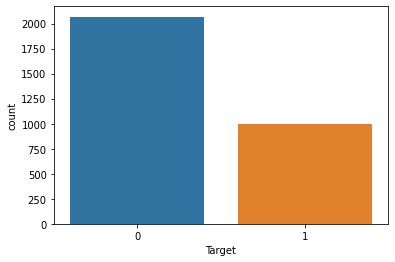

In [ ]:
sns.countplot(data=X_X9,x='Target')

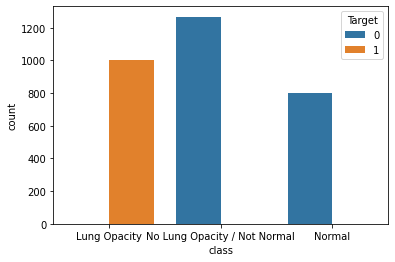

In [ ]:
sns.countplot(data=X_X9,x='class',hue='Target')

In [ ]:
X_X9['Modality'].unique() 

['CR']
Categories (1, object): ['CR']

In [ ]:
X_X9['Examined'].unique()

['CHEST']
Categories (1, object): ['CHEST']

In [ ]:
X_X9['ViewPosition'].unique()

['AP', 'PA']
Categories (2, object): ['AP', 'PA']

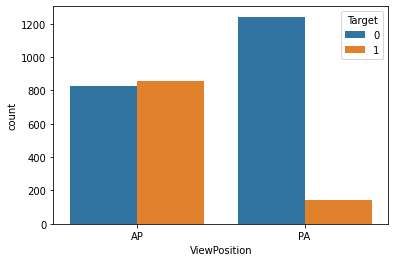

In [ ]:
sns.countplot(data=X_X9,x='ViewPosition',hue='Target')

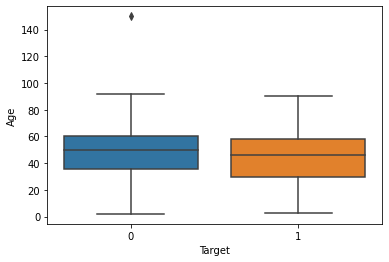

In [ ]:
sns.boxplot(x=X_X9['Target'],y=X_X9['Age'])

In [ ]:
Age_outlier=calOutliers(X_X9['Age'])
print(Age_outlier)

1


**Key Observations** 
- All age groups are impacted 
- Age has an outlier which can be safely ignored
- Males are more impacted than Female but not in big margin
- Impacted patients are about 1000 in numbers out of 3068 samples
- All records are with CR(Computed Radiography) modality so we can ignore this
- All records are with Chest examined so we can ignore this
- There are two view position categories such as AP and PA

### Hypothesis Checks
 - Age of certain range only has Pneumonia probabilities
    - O to 29
    - 30 to 60
    - Above 60
 - Men look more vulnerable for Pneumonia infection and severity
 - View position AP or PA significant for Pneumonia detection

#### Let's understand the Pneumonia impacts of age groups

In [ ]:
Check_Age_Factor(X_X9)

                Age 0 -29   Age 30 -60  Age above 60
Pneumonia      161.000000   387.000000    139.000000
Non Pneumonia  329.000000  1251.000000    488.000000
Impact Ratio    32.857143    23.626374     22.169059


#### Let's understand the difference between the pneumonia impacts over gender proportion

In [ ]:
Check_Gender_Factor(X_X9[X_X9['Sex_Label']==1],X_X9[X_X9['Sex_Label']==0])

z_stat=2.7987942838851976, p_val=0.005129380487442805
Male and Female proportions are significantly varying with Pneumonia
                      Male      Female
Pneumonia       421.000000  266.000000
Non Pneumonia  1141.000000  927.000000
Ratio            26.952625   22.296731


#### Let's check the proportion of view positions (AP, PA)

In [ ]:
Check_Viewpositions_Factor(X_X9[X_X9['ViewPosition_Label']==0],X_X9[X_X9['ViewPosition_Label']==1])

z_stat=19.14610787474422, p_val=1.0429661760229107e-81
AP and PA view positions proportions are significantly varying with Pneumonia
                      AP           PA
Pneumonia      564.00000   123.000000
Non Pneumonia  826.00000  1242.000000
Ratio           40.57554     9.010989


#### **Key Observations**
- All age groups are impacted but patients with age group less than 30 are more impacted in proportions
- Pneumonia Impacted proportion within Age group: [0-29] ~33%, [30-60] ~24%, [Above 60] ~22%
- Male Proportion looks a bit higher with pneumonia impacts than Female proportion (Male - 27%, Female - 22%)
- View position AP looks to be more Pneumonia detecting position, suggested by ~41% within the sample taken with AP; whereas for PA it is about 9%

### X9 Data Insights
- All images  are of same size 1024
- Impacted patients are about 1000 in numbers out of 3068 samples
- All records are with CR(Computed Radiography) modality
- All records are with Chest examined 
- Bounding boxes won't be available for non-infected (or target value 0) patients
- No duplicates of patients between Pneumonia and Normal records
- All age groups are impacted but patients with age group less than 30 are more impacted in proportions
- Pneumonia Impacted proportion within Age group: [0-29] ~33%, [30-60] ~24%, [Above 60] ~22%
- Male Proportion looks a bit higher with pneumonia impacts than Female proportion (Male - 27%, Female - 22%)
- View position AP looks to be more Pneumonia detecting position, suggested by ~41% within the sample taken with AP; whereas for PA it is about 9%

## X10 - Batch ANALYSIS

In [ ]:
train_images_X10_files = list(get_files('./X10'))

### Pickling batch image files

In [ ]:
train_images_X10_pickle = open('./train_images_X10_pickle','wb')
pickle.dump(train_images_X10_files,train_images_X10_pickle)
train_images_X10_pickle.close()

### Loading batch image pickles

In [ ]:
train_images_X10_pickle = open('./train_images_X10_pickle','rb')
train_images_X10 = pickle.load(train_images_X10_pickle)

### Check the batch image size

In [ ]:
check_img_size(train_images_X10)

**Key Observations**
 - All images  are of same size 1024

### Combine Image Array data and labels

In [ ]:
X10_DICOM_metadata = extract_batch_DICOM_image_Data(train_images_X10,224)


In [ ]:
X_X10 = pd.merge(X10,X10_DICOM_metadata,how='inner', on='patientId')

#### Pickling the combined version of batch

In [ ]:
train_X10_comb_pickle = open('./train_X10_comb_pickle','wb')
pickle.dump(X_X10,train_X10_comb_pickle)
train_X10_comb_pickle.close()

### Loading the combined version of batch

In [ ]:
train_X10_comb_pickle = open('./train_X10_comb_pickle','rb')
X_X10 = pickle.load(train_X10_comb_pickle)

### Let's understand the dicom metadata such as Age, Sex, Modality, viewPosition, body part examined

In [ ]:
X_X10.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2615 entries, 0 to 2614
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   patientId     2615 non-null   object 
 1   class         2615 non-null   object 
 2   x             555 non-null    float64
 3   y             555 non-null    float64
 4   width         555 non-null    float64
 5   height        555 non-null    float64
 6   Target        2615 non-null   int64  
 7   Img_data      2615 non-null   object 
 8   Age           2615 non-null   object 
 9   Sex           2615 non-null   object 
 10  Modality      2615 non-null   object 
 11  Examined      2615 non-null   object 
 12  ViewPosition  2615 non-null   object 
dtypes: float64(4), int64(1), object(8)
memory usage: 286.0+ KB


**Key Observations**
 - DICOM metadata contains all as object types
 - Target variable is of int64
 - Bounding box values are following float64 type

In [ ]:
X_X10.isnull().sum()

patientId          0
class              0
x               2060
y               2060
width           2060
height          2060
Target             0
Img_data           0
Age                0
Sex                0
Modality           0
Examined           0
ViewPosition       0
dtype: int64

**Key Observations** 
 - Except x,y,height & width, rest are not null. It is understandable from our earlier data assessment that bounding boxes won't be available for non-infected (or target value 0) patients

### Let's change object type to int for number variables

In [ ]:
X_X10=X_X10.astype({"Age": int, "Sex": 'category',"ViewPosition":'category',"Modality":'category',"Examined":'category'})

### Label Encoding for categorical Variables

In [ ]:
labelencoder = LabelEncoder()
X_X10['Sex_Label']= labelencoder.fit_transform(X_X10['Sex'])
X_X10['Modality_Label']=labelencoder.fit_transform(X_X10['Modality'])
X_X10['Examined_Label']=labelencoder.fit_transform(X_X10['Examined'])
X_X10['ViewPosition_Label']=labelencoder.fit_transform(X_X10['ViewPosition'])

In [ ]:
X_X10.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2615 entries, 0 to 2614
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   patientId           2615 non-null   object  
 1   class               2615 non-null   object  
 2   x                   555 non-null    float64 
 3   y                   555 non-null    float64 
 4   width               555 non-null    float64 
 5   height              555 non-null    float64 
 6   Target              2615 non-null   int64   
 7   Img_data            2615 non-null   object  
 8   Age                 2615 non-null   int64   
 9   Sex                 2615 non-null   category
 10  Modality            2615 non-null   category
 11  Examined            2615 non-null   category
 12  ViewPosition        2615 non-null   category
 13  Sex_Label           2615 non-null   int64   
 14  Modality_Label      2615 non-null   int64   
 15  Examined_Label      2615 non-null   in

### Pickling with label encoding for categorical variables

In [ ]:
train_X_X10_comb_pickle = open('./train_X_X10_comb_pickle','wb')
pickle.dump(X_X10,train_X_X10_comb_pickle)
train_X_X10_comb_pickle.close()

### Loading the pickle  with label encoding for categorical variables

In [ ]:
train_X_X10_comb_pickle = open('./train_X_X10_comb_pickle','rb')
X_X10=pickle.load(train_X_X10_comb_pickle)

In [ ]:
X_X10.head(5)

,patientId,class,x,y,width,height,Target,Img_data,Age,Sex,Modality,Examined,ViewPosition,Sex_Label,Modality_Label,Examined_Label,ViewPosition_Label
0,02cfa7d1-61e0-4d9e-8664-9a7469ccab76,Lung Opacity,713.0,420.0,152.0,350.0,1,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 22, 8, 7, 6, 6, 5...",58,M,CR,CHEST,AP,1,0,0,0
1,02cfa7d1-61e0-4d9e-8664-9a7469ccab76,Lung Opacity,299.0,397.0,181.0,348.0,1,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 22, 8, 7, 6, 6, 5...",58,M,CR,CHEST,AP,1,0,0,0
2,031d627f-e6af-4588-8cca-6be8aa1222c7,Lung Opacity,247.0,716.0,173.0,77.0,1,"[[5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,...",72,M,CR,CHEST,AP,1,0,0,0
3,031d627f-e6af-4588-8cca-6be8aa1222c7,Lung Opacity,267.0,436.0,98.0,194.0,1,"[[5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,...",72,M,CR,CHEST,AP,1,0,0,0
4,031d627f-e6af-4588-8cca-6be8aa1222c7,Lung Opacity,649.0,498.0,231.0,269.0,1,"[[5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,...",72,M,CR,CHEST,AP,1,0,0,0


### Multi-variate Analysis

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

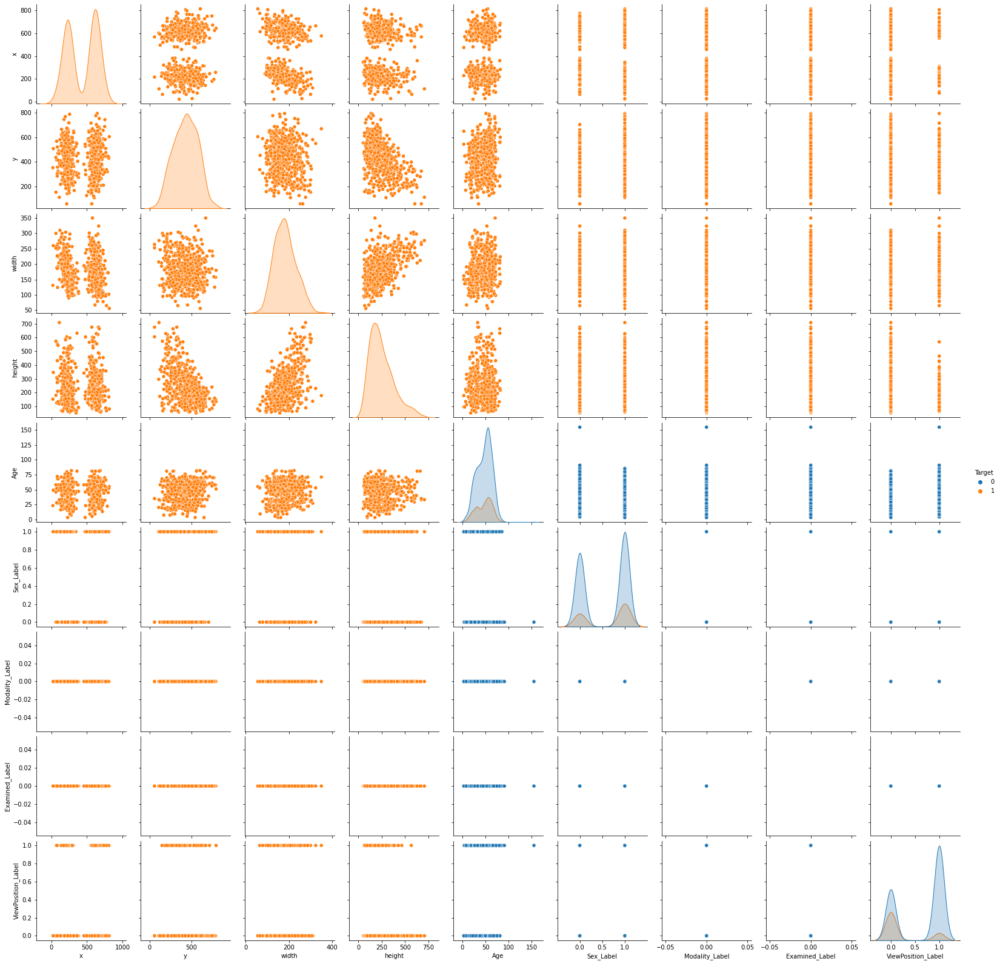

In [ ]:
sns.pairplot(X_X10, hue='Target',diag_kind='kde')

**Key Observations** 
- Age looks to be having Pneumonia infected patients of all age groups
- Sex both male and female are not so predictable but combining age and sex may give some interesting points
- View Position AP provides more Pneumonia reports than PA

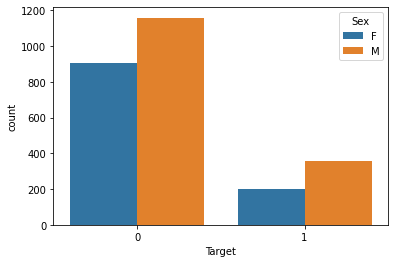

In [ ]:
sns.countplot(data=X_X10,x='Target',hue='Sex')

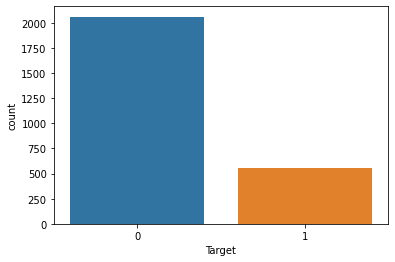

In [ ]:
sns.countplot(data=X_X10,x='Target')

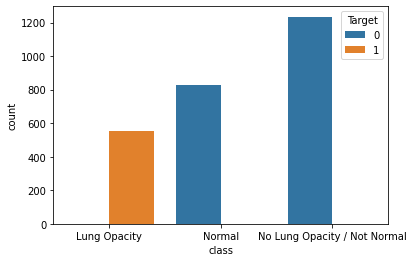

In [ ]:
sns.countplot(data=X_X10,x='class',hue='Target')

In [ ]:
X_X10['Modality'].unique() 

['CR']
Categories (1, object): ['CR']

In [ ]:
X_X10['Examined'].unique()

['CHEST']
Categories (1, object): ['CHEST']

In [ ]:
X_X10['ViewPosition'].unique()

['AP', 'PA']
Categories (2, object): ['AP', 'PA']

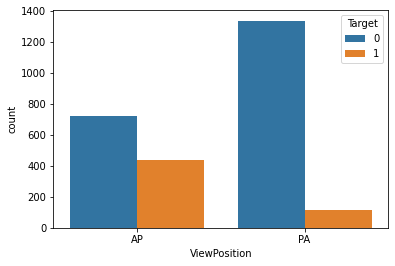

In [ ]:
sns.countplot(data=X_X10,x='ViewPosition',hue='Target')

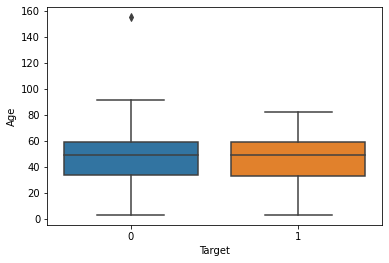

In [ ]:
sns.boxplot(x=X_X10['Target'],y=X_X10['Age'])

In [ ]:
Age_outlier=calOutliers(X_X10['Age'])
print(Age_outlier)

1


**Key Observations** 
- All age groups are impacted 
- Age has an outlier which can be safely ignored
- Males are more impacted than Female but not in big margin
- Impacted patients are about 555 in numbers out of 2615 samples
- All records are with CR(Computed Radiography) modality so we can ignore this
- All records are with Chest examined so we can ignore this
- There are two view position categories such as AP and PA

### Hypothesis Checks
 - Age of certain range only has Pneumonia probabilities
    - O to 29
    - 30 to 60
    - Above 60
 - Men look more vulnerable for Pneumonia infection and severity
 - View position AP or PA significant for Pneumonia detection

#### Let's understand the Pneumonia impacts of age groups

In [ ]:
Check_Age_Factor(X_X10)

                Age 0 -29   Age 30 -60  Age above 60
Pneumonia       65.000000   191.000000     78.000000
Non Pneumonia  362.000000  1251.000000    447.000000
Impact Ratio    15.222482    13.245492     14.857143


#### Let's understand the difference between the pneumonia impacts over gender proportion

In [ ]:
Check_Gender_Factor(X_X10[X_X10['Sex_Label']==1],X_X10[X_X10['Sex_Label']==0])

z_stat=2.384615003833325, p_val=0.01709700324648256
Male and Female proportions are significantly varying with Pneumonia
                     Male  Female
Pneumonia       211.00000   123.0
Non Pneumonia  1158.00000   902.0
Ratio            15.41271    12.0


#### Let's check the proportion of view positions (AP, PA)

In [ ]:
Check_Viewpositions_Factor(X_X10[X_X10['ViewPosition_Label']==0],X_X10[X_X10['ViewPosition_Label']==1])

z_stat=14.043306870277778, p_val=8.466778608131449e-45
AP and PA view positions proportions are significantly varying with Pneumonia
                       AP           PA
Pneumonia      253.000000    81.000000
Non Pneumonia  722.000000  1338.000000
Ratio           25.948718     5.708245


#### **Key Observations**
- All age groups are impacted but patients with age group less than 30 are more impacted in proportions
- Pneumonia Impacted proportion within Age group: [0-29] ~15%, [30-60] ~13%, [Above 60] ~14%
- Male proportion look slightly higher than female for pneumonia impacts (Male: 15, Female:12)
- View position AP looks to be more Pneumonia detecting position, suggested by ~26% within the sample taken with AP; whereas for PA it is about 6%

### X10 Data Insights
- All images  are of same size 1024
- Impacted patients are about 555 in numbers out of 2615 samples
- All records are with CR(Computed Radiography) modality
- All records are with Chest examined 
- Bounding boxes won't be available for non-infected (or target value 0) patients
- No duplicates of patients between Pneumonia and Normal records
- All age groups are impacted but patients with age group less than 30 are more impacted in proportions
- Pneumonia Impacted proportion within Age group: [0-29] ~15%, [30-60] ~13%, [Above 60] ~14%
- Male proportion look slightly higher than female for pneumonia impacts (Male: 15, Female:12)
- View position AP looks to be more Pneumonia detecting position, suggested by ~26% within the sample taken with AP; whereas for PA it is about 6%

## Unify all batch data into a single pickle file

### Append all data objects into one dataframe object

In [ ]:
X_train_data_set = X_X1.append([X_X2,X_X3,X_X4,X_X5,X_X6,X_X7,X_X8,X_X9,X_X10])

In [ ]:
len(X_train_data_set.patientId.unique())

26684

In [ ]:
len(X_train_data_set[X_train_data_set['Target']==1].patientId.unique())

6012

In [ ]:
len(X_train_data_set[X_train_data_set['Target']==0].patientId.unique())

20672

### Pickling the train data set

In [ ]:
X_train_data_set_pickle = open('./X_train_data_set_pickle','wb')

In [ ]:
pickle.dump(X_train_data_set,X_train_data_set_pickle)

In [ ]:
X_train_data_set_pickle.close()

### Loading the train data set pickle

In [ ]:
X_train_data_set_pickle = open('./X_train_data_set_pickle','rb')

In [ ]:
X_train_data_set = pickle.load(X_train_data_set_pickle)

### Quick analysis on the unified training data set

In [ ]:
X_train_data_set.head()

In [ ]:
len(X_train_data_set[X_train_data_set['Sex_Label']==1].patientId.unique())

In [ ]:
len(X_train_data_set[X_train_data_set['Sex_Label']==0].patientId.unique())

In [ ]:
Check_Age_Factor(X_train_data_set)

                 Age 0 -29    Age 30 -60  Age above 60
Pneumonia      1238.000000   3519.000000   1255.000000
Non Pneumonia  3491.000000  12463.000000   4718.000000
Impact Ratio     26.178896     22.018521     21.011217


In [ ]:
Check_Gender_Factor(X_train_data_set[X_train_data_set['Sex_Label']==1],X_train_data_set[X_train_data_set['Sex_Label']==0])

z_stat=2.7526487800989337, p_val=0.005911527858232293
Male and Female proportions are significantly varying with Pneumonia
                       Male       Female
Pneumonia       3510.000000  2502.000000
Non Pneumonia  11656.000000  9016.000000
Ratio             23.143874    21.722521


In [ ]:
Check_Viewpositions_Factor(X_train_data_set[X_train_data_set['ViewPosition_Label']==0],X_train_data_set[X_train_data_set['ViewPosition_Label']==1])

z_stat=56.52510975973358, p_val=0.0
AP and PA view positions proportions are significantly varying with Pneumonia
                        AP            PA
Pneumonia      4664.000000   1348.000000
Non Pneumonia  7509.000000  13163.000000
Ratio            38.314302      9.289505


In [ ]:
calOutliers(X_train_data_set['Age'])

5

In [ ]:
X_train_data_set.describe()

,x,y,width,height,Target,Age,Sex_Label,Modality_Label,Examined_Label,ViewPosition_Label
count,9555.000000,9555.000000,9555.000000,9555.000000,30227.000000,30227.000000,30227.000000,30227.0,30227.0,30227.000000
mean,394.047724,366.839560,218.471376,329.269702,0.316108,46.797764,0.569557,0.0,0.0,0.493929
std,204.574172,148.940488,59.289475,157.750755,0.464963,16.892940,0.495146,0.0,0.0,0.499971
min,2.000000,2.000000,40.000000,45.000000,0.000000,1.000000,0.000000,0.0,0.0,0.000000
25%,207.000000,249.000000,177.000000,203.000000,0.000000,34.000000,0.000000,0.0,0.0,0.000000
50%,324.000000,365.000000,217.000000,298.000000,0.000000,49.000000,1.000000,0.0,0.0,0.000000
75%,594.000000,478.500000,259.000000,438.000000,1.000000,59.000000,1.000000,0.0,0.0,1.000000
max,835.000000,881.000000,528.000000,942.000000,1.000000,155.000000,1.000000,0.0,0.0,1.000000


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


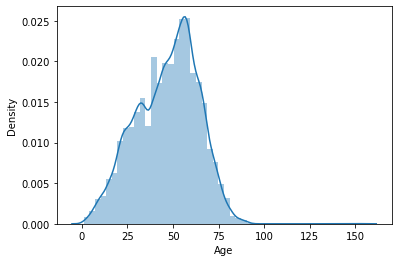

In [ ]:
sns.distplot(X_train_data_set['Age'])

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


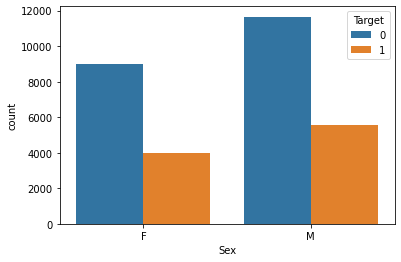

In [ ]:
sns.countplot(X_train_data_set['Sex'],hue=X_train_data_set['Target'])

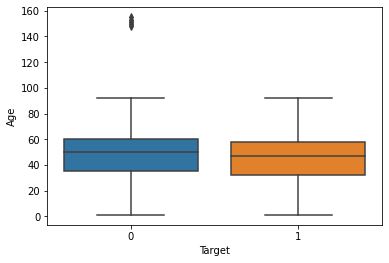

In [ ]:
sns.boxplot(x=X_train_data_set['Target'],y=X_train_data_set['Age'])

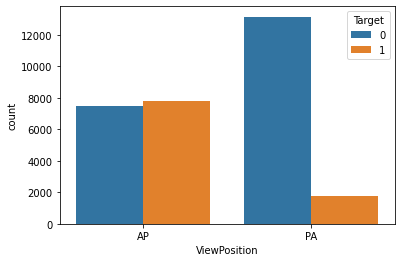

In [ ]:
sns.countplot(data=X_train_data_set,x='ViewPosition',hue='Target')

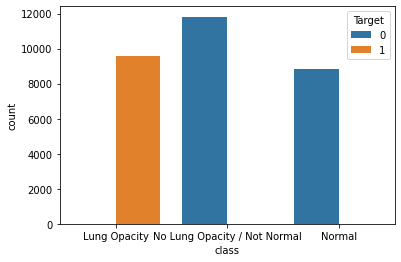

In [ ]:
sns.countplot(data=X_train_data_set,x='class',hue='Target')

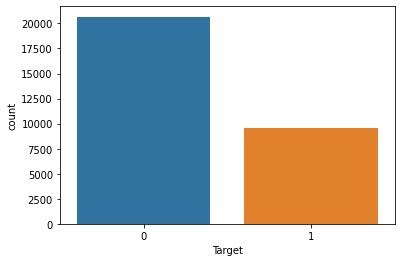

In [ ]:
sns.countplot(data=X_train_data_set,x='Target')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit

Text(0.5, 0.98, 'Pneumonia Location Distributions')

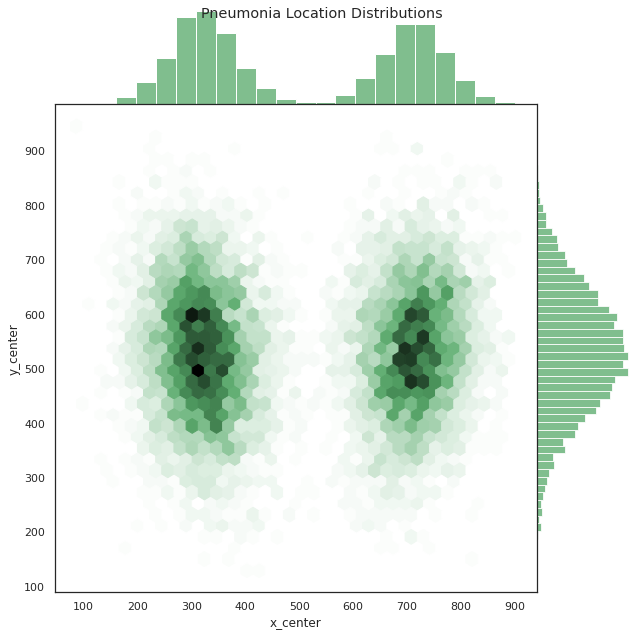

In [ ]:
#Check the pattern of the penumonia location
X_train_pneumonia = X_train_data_set[X_train_data_set['Target']==1]
sns.set(style="white", color_codes=True)
X_train_pneumonia['x_center']=X_train_pneumonia['x'] + X_train_pneumonia['width']/2
X_train_pneumonia['y_center']=X_train_pneumonia['y'] + X_train_pneumonia['height']/2
# Plot x and y centers
sns.jointplot("x_center", "y_center",kind="hex", data=X_train_pneumonia, height=9, space=0, color="g")
plt.suptitle('Pneumonia Location Distributions')

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


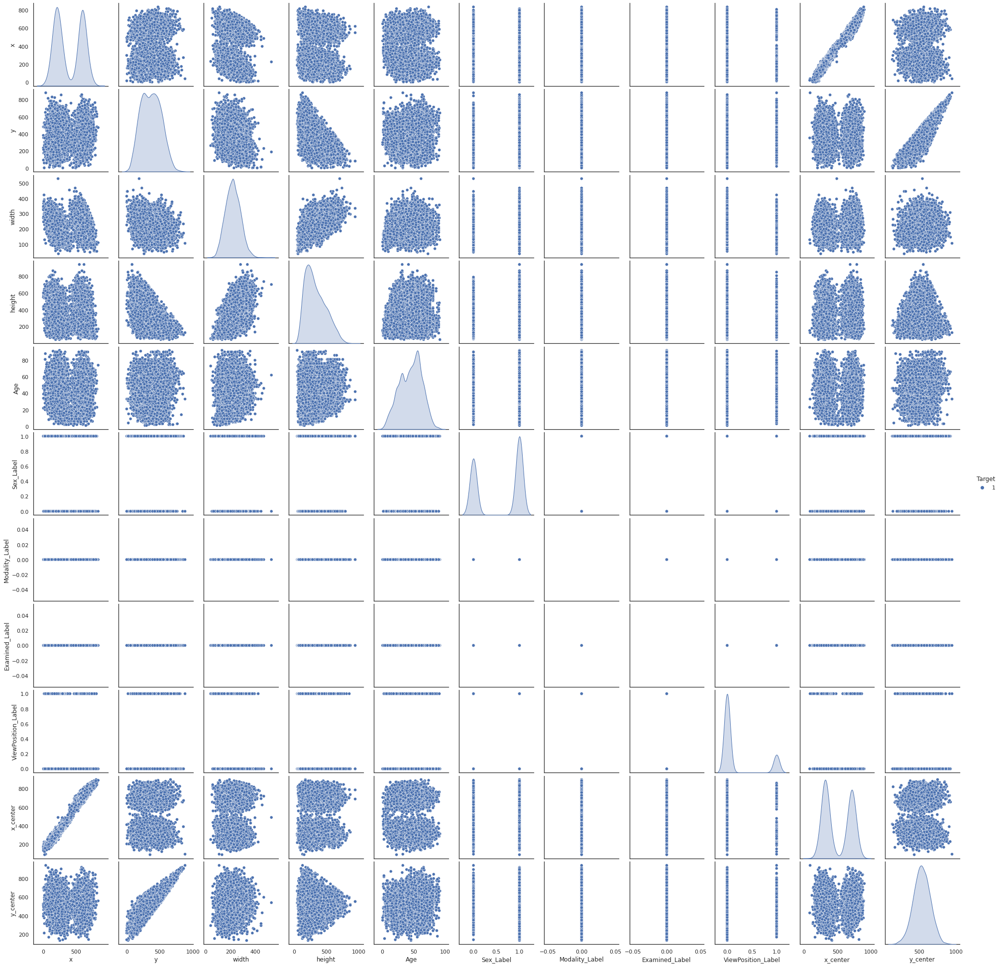

In [ ]:
sns.pairplot(X_train_pneumonia,hue='Target',diag_kind='kde')

# Overall EDA Observations & Insights
- **Train Data:**
    - All DICOM images (given) are of size (1024)
    - All records are with CR(Computed Radiography) modality and of patients with chest examined
    - Bounding boxes won't be available for non-infected (or target value 0) patients
    - Patients are classified with three classes such as ***No Lung Opacity / Not Normal, Normal, Lung Opacity***
    - ***Patients classified with Lung Opacity are Pneumonia infected***
    - ***No duplicates of patients between Pneumonia and Normal records***
    - No significant outliers with Age but there are 5 records which can be safely ignored, Otherwise ***Age data looks normally distributed***
    - There are ***26684*** number of patients with the ***split of 6012 patients impacted with Pneumonia and 20672 patients with no pneumonia infection***
    - Patient records with age ranging from 1 to 155 out of which ***age group lesser than 30 are little more impacted with Pneumonia than other age groups***
    - Pneumonia Impacted proportion within Age group:
        - ***Age 0 - 29***: 26%
        - ***Age 30 - 60***: 22%
        - ***Age above 60***: 21%
    - Patient Gender Split : (***Male*** : 15166, ***Female*** : 11518)
    - ***Male proportion with Pneumonia infection looks slightly higher than  Female Proportions (Male - 23%, Female - 22%)***
    - ***View position AP looks to be more Pneumonia detecting position***, suggested by ~38% within the sample taken with AP; whereas for PA it is about 9%
- **Test Data:**
    - Total ***unique patient records of test data***: 3000
    - ***No duplicates of patients***
    - All DICOM images (given) are of size (1024)
    - All records are with CR(Computed Radiography) modality and of patients with chest examined
    - Patient Age group: 
        - ***Age 0 - 29***: 530
        - ***Age 30 - 60***: 1790
        - ***Age above 60***: 680
    - Patient Gender Split: (***Male*** : 1714, ***Female*** : 1286)
    - There is an outlier in Age, except that one outlier, Age data looks normally distributed
    - ***AP view position based records 1382*** out of 3000